# Impact of AirBnB on the Prices of Houses in Dublin between June 2021 and May 2022

- Student Name: Karina Jonina
- Student Code: c00278440
- Module Title: Dissertation
- Module Code: DISSC5201
- Supervisor: Dr Oisin Cawley
- Course Name: Master of Science in Data Science
- Course Code: CW_KCDAR_M
- Assignment Weighting: 100%
- Due Date: 15th August 2022

In [1]:
!apt install gdal-bin python-gdal python3-gdal --quiet
!apt install python3-rtree --quiet
!pip install --upgrade pip --quiet
!pip install descartes --quiet
!pip install ipywidgets --quiet

!pip install splot --quiet
!pip install -U mgwr --quiet
!pip install geopandas


Reading package lists...
Building dependency tree...
Reading state information...
gdal-bin is already the newest version (2.2.3+dfsg-2).
python-gdal is already the newest version (2.2.3+dfsg-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  python3-numpy
Suggested packages:
  python-numpy-doc python3-nose python3-numpy-dbg
The following NEW packages will be installed:
  python3-gdal python3-numpy
0 upgraded, 2 newly installed, 0 to remove and 19 not upgraded.
Need to get 2,288 kB of archives.
After this operation, 13.2 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 python3-numpy amd64 1:1.13.3-2ubuntu1 [1,943 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 python3-gdal amd64 2.2.3+dfsg-2 [346 kB]
Fetched 2,288 kB in 3s (865 kB/s)
Selecting previously unselected package python3

In [2]:
# # download necessary python libraries

import geopandas as gpd
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as plt
import matplotlib.pyplot as plt
%matplotlib inline
import statsmodels.api as sm
import statsmodels.formula.api as smf
import patsy
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.linear_model import LassoCV, RidgeCV, ElasticNetCV
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.metrics import mean_absolute_error as mae
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Perceptron
import scipy.stats as stats
from scipy import stats
import plotly.express as px
sns.set()

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier

from sklearn.preprocessing import PowerTransformer



import matplotlib as mpl
import libpysal as ps
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW
from mgwr.utils import shift_colormap, truncate_colormap

pd.set_option('display.float_format', lambda x: '%.5f' % x)

pd.set_option('display.max_columns', None)

pd.set_option('display.max_rows', None)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
# ! pip install pysal

# import pysal as ps

# from pysal import *

# from pysal.contrib import gwr
# from pysal.contrib.gwr.gwr import GWR
# from pysal.contrib.gwr.sel_bw import Sel_BW
# from pysal.contrib.glm.family import Gaussian


In [4]:
# Connect to Google Drive

# mount google drive to the virtual machine to use files from within here
from google.colab import drive
drive.mount('/content/drive')

# reading in the csv
ppr = pd.read_csv('/content/drive/My Drive/c00278440_Karina_Jonina_MSc_Data_Science_Dissertation/Data/final_ppr_with_distances.csv', parse_dates = ['date'])


Mounted at /content/drive


In [5]:
# ppr = pd.read_csv('Data/final_ppr.csv)

### Eircodes

In [6]:
# how many EIRCODES are there in selected counties?
len(ppr['eircode_description'].unique())

57

In [7]:
ppr['area_in_km2_eircode'].describe()

count   22169.00000
mean      218.69838
std       331.95669
min         3.21679
25%        13.73244
50%        62.81112
75%       236.91547
max      1509.91804
Name: area_in_km2_eircode, dtype: float64

In [8]:
fig = px.histogram(ppr, x="area_in_km2_eircode", title = 'Histogram of area_in_km2_eircode')
fig.update_layout( xaxis_title="area_in_km2_eircode", yaxis_title="")
fig.show()



In [9]:

fig = px.box(ppr, x="area_in_km2_eircode", title = 'Boxplot area_in_km2_eircode')
fig.show()

In [10]:
# how many LEA are there in Dublin?
ppr[['county', 'eircode_description']].groupby(['county'])['eircode_description'].nunique()

county
DUBLIN     37
KILDARE    10
LOUTH       2
MEATH      14
WICKLOW     8
Name: eircode_description, dtype: int64

### LEA

In [11]:
# how many LEAs are there in selected counties?
len(ppr['lea'].unique())

56

In [12]:
# how many LEAS are there in Dublin?
ppr[['county', 'lea']].groupby(['county'])['lea'].nunique()

county
DUBLIN     31
KILDARE     8
LOUTH       5
MEATH       6
WICKLOW     6
Name: lea, dtype: int64

In [13]:
ppr['area_in_km2_lea'].describe()

count   22169.00000
mean      114.72057
std       166.38458
min         4.63271
25%        11.01717
50%        46.76277
75%       164.05313
max       916.21064
Name: area_in_km2_lea, dtype: float64

In [14]:
fig = px.histogram(ppr, x="area_in_km2_lea", title = 'Histogram of area_in_km2_lea')
fig.update_layout( xaxis_title="area_in_km2_lea", yaxis_title="")
fig.show()


In [15]:
fig = px.box(ppr, x="area_in_km2_lea", title = 'Boxplot area_in_km2_lea')
fig.show()

### Electoral Division

In [16]:
# how many ED guid are there in selected counties?
len(ppr['electoral_divisions'].unique())

598

In [17]:
ppr['area_in_km2_ed'].describe()

count   22169.00000
mean       12.48778
std        14.83235
min         0.14303
25%         1.00981
50%         4.28617
75%        21.29360
max        76.35121
Name: area_in_km2_ed, dtype: float64

In [18]:
fig = px.histogram(ppr, x="area_in_km2_ed", title = 'Histogram of area_in_km2_ed')
fig.update_layout( xaxis_title="area_in_km2_ed", yaxis_title="")
fig.show()

In [19]:
fig = px.box(ppr, x="area_in_km2_ed", title = 'Boxplot ofarea_in_km2_ed')
fig.show()

In [20]:
# how many ED are there in Dublin?
ppr[['county', 'electoral_divisions']].groupby(['county'])['electoral_divisions'].nunique()

county
DUBLIN     322
KILDARE     80
LOUTH       43
MEATH       82
WICKLOW     72
Name: electoral_divisions, dtype: int64

## Small Areas

In [21]:
# how many SA guid are there in selected counties?
len(ppr['smallest_guid'].unique())

5910

In [22]:
ppr['small_area_guid_area_in_km2'].describe()

count   22169.00000
mean        0.87775
std         2.78754
min         0.00193
25%         0.03622
50%         0.07071
75%         0.33681
max        61.90987
Name: small_area_guid_area_in_km2, dtype: float64

In [23]:
fig = px.histogram(ppr, x="small_area_guid_area_in_km2", title = 'Histogram of areasmall_area_guid_area_in_km2_in_km2_ed')
fig.update_layout( xaxis_title="small_area_guid_area_in_km2", yaxis_title="")
fig.show()


In [24]:
fig = px.box(ppr, x="small_area_guid_area_in_km2", title = 'Boxplot small_area_guid_area_in_km2')
fig.show()

In [25]:
# how many SA are there in Dublin?
ppr[['county', 'smallest_guid']].groupby(['county'])['smallest_guid'].nunique()

county
DUBLIN     3964
KILDARE     622
LOUTH       380
MEATH       526
WICKLOW     418
Name: smallest_guid, dtype: int64

In [26]:
ppr['total_type_of_accommodation'][ppr['county'] == 'DUBLIN'].describe()

count   13932.00000
mean      103.38839
std        26.38102
min        28.00000
25%        84.00000
50%       100.00000
75%       120.00000
max       275.00000
Name: total_type_of_accommodation, dtype: float64

In [27]:
ppr['total_type_of_accommodation'][ppr['county'] == 'WICKLOW'].describe()

count   1610.00000
mean     102.65776
std       24.50000
min       29.00000
25%       86.00000
50%      104.00000
75%      120.00000
max      182.00000
Name: total_type_of_accommodation, dtype: float64

In [28]:
ppr['total_type_of_accommodation'][ppr['county'] == 'KILDARE'].describe()

count   2995.00000
mean      99.55626
std       22.94750
min       52.00000
25%       81.00000
50%       99.00000
75%      115.00000
max      176.00000
Name: total_type_of_accommodation, dtype: float64

In [29]:
ppr['total_type_of_accommodation'][ppr['county'] == 'LOUTH'].describe()

count   1466.00000
mean     102.73806
std       24.09143
min       44.00000
25%       84.00000
50%      103.00000
75%      120.00000
max      175.00000
Name: total_type_of_accommodation, dtype: float64

In [30]:
ppr['total_type_of_accommodation'][ppr['county'] == 'MEATH'].describe()

count   2166.00000
mean     105.19437
std       25.88999
min       35.00000
25%       85.00000
50%      101.00000
75%      124.00000
max      222.00000
Name: total_type_of_accommodation, dtype: float64

### Important Info

In [31]:
# ED_gdf = ED_gdf[[ 'electoral_divisions', 'geometry']]

# LEA_gdf = LEA_gdf[['lea', 'geometry']]

## Data Exploration

In [32]:
ppr['county'].unique()

array(['DUBLIN', 'LOUTH', 'MEATH', 'WICKLOW', 'KILDARE'], dtype=object)

In [33]:
# print summary information to view data
ppr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22169 entries, 0 to 22168
Data columns (total 95 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   id                                 22169 non-null  int64         
 1   date                               22169 non-null  datetime64[ns]
 2   month_year                         22169 non-null  object        
 3   total_address                      22169 non-null  object        
 4   formatted_address                  22169 non-null  object        
 5   input_string                       22169 non-null  object        
 6   eircode                            22169 non-null  object        
 7   price                              22169 non-null  float64       
 8   not_full_market_price              22169 non-null  object        
 9   vat_exclusive                      22169 non-null  object        
 10  description                       

In [34]:
# print summary information to view data
ppr.head().transpose()

,0,1,2,3,4
id,1000000,1000001,1000002,1000003,1000004
date,2022-06-30 00:00:00,2022-06-30 00:00:00,2022-06-29 00:00:00,2022-06-28 00:00:00,2022-06-24 00:00:00
month_year,2022-06,2022-06,2022-06,2022-06,2022-06
total_address,"25 FINGAL STREET, OFF CORK STREET, DUBLIN 8, D...","8 THIRLESTANE TERRACE, THOMAS COURT, DUBLIN 8,...","11 BOW BRIDGE, BOW BRIDGE HOUSE, KILMAINHAM, D...","26 STREET JAMES COURT, MOUNT BROWN, KILMAINHAM...","34 THE WAREHOUSE, CLANBRASSIL TERRACE, CLANBRA..."
formatted_address,"25 FINGAL ST, SAINT CATHERINE'S, DUBLIN, D08 Y...","THOMAS CT, SAINT CATHERINE'S, DUBLIN, IRELAND","11 BOW BRIDGE, KILMAINHAM, DUBLIN 8, D08 A0K2,...","MOUNT BROWN, SAINT JAMES' (PART OF PHOENIX PAR...","8 CLANBRASSIL TERRACE, DUBLIN, IRELAND"
input_string,"25 FINGAL STREET, OFF CORK STREET, DUBLIN 8, D...","8 THIRLESTANE TERRACE, THOMAS COURT, DUBLIN 8,...","11 BOW BRIDGE, BOW BRIDGE HOUSE, KILMAINHAM, D...","26 STREET JAMES COURT, MOUNT BROWN, KILMAINHAM...","34 THE WAREHOUSE, CLANBRASSIL TERRACE, CLANBRA..."
eircode,D08Y2Y6,D08Y3V5,D08P903,D08KN63,D08FY76
price,40000.00000,600000.00000,225000.00000,320000.00000,760000.00000
not_full_market_price,No,No,No,No,No
vat_exclusive,No,No,No,No,No


In [35]:
# print summary information to view data
ppr.tail().transpose()

,22164,22165,22166,22167,22168
id,1023179,1023180,1023182,1023183,1023186
date,2021-12-23 00:00:00,2021-11-26 00:00:00,2021-10-21 00:00:00,2021-09-30 00:00:00,2021-07-05 00:00:00
month_year,2021-12,2021-11,2021-10,2021-09,2021-07
total_address,"JERUSALEM, CARLOW, KILDARE, KILDARE, R93N9P6, ...","MUNNY UPPER, COOLKENNO, WICKLOW, WICKLOW, R93Y...","CASTLEROE, MAGANEY, ATHY, KILDARE, IRELAND","1707 CASTLEROE WEST, MAGANEY, KILDARE, KILDARE...","BROOKVILLE HOUSE, HIGHFIELD, CARBURY, KILDARE,..."
formatted_address,"JERUSALEM, CO. KILDARE, R93 N9P6, IRELAND","MONEY UPPER, CO. WICKLOW, R93 YK22, IRELAND","CASTLEROE HOUSE, CASTLEROE EAST, MAGANEY, CO. ...","CASTLEROE WEST, CO. KILDARE, R93 H9C8, IRELAND","BROOKVILLE, OLDCOURT, EDENDERRY, CO. KILDARE, ..."
input_string,"JERUSALEM, CARLOW, KILDARE, KILDARE, R93N9P6, ...","MUNNY UPPER, COOLKENNO, WICKLOW, WICKLOW, R93Y...","CASTLEROE, MAGANEY, ATHY, KILDARE, IRELAND","1707 CASTLEROE WEST, MAGANEY, KILDARE, KILDARE...","BROOKVILLE HOUSE, HIGHFIELD, CARBURY, KILDARE,..."
eircode,R93N9P6,R93YK22,EIRCODE UNAVAILABLE,R93H9C8,R45HA29
price,250000.00000,310000.00000,365000.00000,122092.03000,750000.00000
not_full_market_price,No,No,No,Yes,No
vat_exclusive,No,No,No,No,No


In [36]:
# review statistics
ppr.describe()

,id,price,latitude,longitude,area_in_km2_eircode,area_in_km2_lea,small_area_guid_area_in_km2,house_bungalow,flat_apartment,bed_sit,caravan_mobile_home,type_of_accommodation_not_stated,total_type_of_accommodation,pre_1919,1919_1945,1946_1960,1961_1970,1971_1980,1981_1990,1991_2000,2001_2010,2011_or_later,year_built_not_stated,total_year_built,1_room,2_rooms,3_rooms,4_rooms,5_rooms,6_rooms,7_rooms,8_or_more_rooms,number_of_rooms_not_stated,total_number_of_rooms,house_bungalow_%,flat_apartment_%,bed_sit_%,caravan_mobile_home_%,type_of_accommodation_not_statd_%,pre_1919_%,1919_1945_%,1946_1960_%,1961_1970_%,1971_1980_%,1981_1990_%,1991_2000_%,2001_2010_%,2011_or_later_%,year_built_not_stated_%,1_room_%,2_rooms_%,3_rooms_%,4_rooms_%,5_rooms_%,6_rooms_%,7_rooms_%,8_or_more_rooms_%,number_of_rooms_not_stated_%,vacant_dwellings,housing_stock,vacancy_rate_%,area_in_km2_ed,crime_total,lea_no_of_listings,ed_no_of_listings,dist_to_railway,dist_to_university,dist_to_luas,dist_to_commercial_zones,dist_to_motorways,dist_to_bus_stops,dist_to_industrial_zones
count,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22169.00000,22145.00000,22135.00000,22145.00000,22145.00000,22145.00000,22145.00000,22145.00000
mean,1011625.12139,378939.04557,53.37839,-6.36063,218.69838,114.72057,0.87775,75.98760,25.13568,0.22265,0.25978,1.34535,102.95106,6.31152,5.62723,7.38509,6.44901,10.25554,8.57179,14.90978,31.52213,3.28441,8.37480,102.69128,1.85011,8.30876,14.29803,12.80847,21.59669,15.23127,10.83788,11.90378,5.85629,102.69128,0.74030,0.24235,0.00223,0.00232,0.01283,0.06494,0.05610,0.07351,0.06311,0.10001,0.08450,0.14590,0.29862,0.03000,0.01289,0.01852,0.08052,0.13712,0.12491,0.20980,0.14790,0.10615,0.11762,0.05718,166.59001,3375.16122,5.57899,12.48778,1677.19813,66.66471,8.74694,4.89508,6.26976,17.09376,1.14147,3.19441,0.67480,0.80970
std,6637.34014,175718.56799,0.20034,0.21310,331.95669,166.38458,2.78754,38.30938,36.48306,1.39554,2.57715,2.96841,25.65240,12.78552,11.97867,15.56252,12.66126,17.72112,14.19110,20.56240,34.96053,9.75662,8.30478,25.55322,4.13530,10.80879,13.89323,10.91460,16.61325,11.77448,10.53166,14.80257,5.21664,25.55322,0.33001,0.32862,0.01333,0.01736,0.02378,0.13104,0.11797,0.15224,0.12270,0.16900,0.13617,0.19578,0.31016,0.08666,0.02397,0.04102,0.09754,0.11892,0.10129,0.15184,0.10952,0.10029,0.14629,0.04815,123.39399,2834.46970,2.50572,14.83235,1451.63242,95.31013,12.34510,6.11503,7.14450,18.14096,1.70393,2.76909,1.51225,1.03430
min,1000000.00000,5300.00000,52.68949,-7.29049,3.21679,4.63271,0.00193,0.00000,0.00000,0.00000,0.00000,0.00000,28.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,28.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,28.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,2.00000,60.00000,1.30000,0.14303,32.00000,3.00000,0.00000,0.01643,0.02201,0.00745,0.00087,0.05549,0.00150,0.00125
25%,1005951.00000,260352.00000,53.28576,-6.43492,13.73244,11.01717,0.03622,52.00000,0.00000,0.00000,0.00000,0.00000,84.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,2.00000,3.00000,0.00000,3.00000,83.00000,0.00000,1.0

In [37]:
ppr.columns

Index(['id', 'date', 'month_year', 'total_address', 'formatted_address',
       'input_string', 'eircode', 'price', 'not_full_market_price',
       'vat_exclusive', 'description', 'size_description',
       'eircode_availability', 'latitude', 'longitude', 'geometry',
       'eircode_name', 'eircode_description', 'area_in_km2_eircode', 'lea',
       'area_in_km2_lea', 'smallest_guid', 'council', 'county',
       'small_area_name', 'small_area_guid_area_in_km2', 'house_bungalow',
       'flat_apartment', 'bed_sit', 'caravan_mobile_home',
       'type_of_accommodation_not_stated', 'total_type_of_accommodation',
       'pre_1919', '1919_1945', '1946_1960', '1961_1970', '1971_1980',
       '1981_1990', '1991_2000', '2001_2010', '2011_or_later',
       'year_built_not_stated', 'total_year_built', '1_room', '2_rooms',
       '3_rooms', '4_rooms', '5_rooms', '6_rooms', '7_rooms',
       '8_or_more_rooms', 'number_of_rooms_not_stated',
       'total_number_of_rooms', 'house_bungalow_%', 'flat_a

In [38]:
# checking for missing data
print('Nan in each columns' , ppr.isna().sum(), sep='\n')

Nan in each columns
id                                    0
date                                  0
month_year                            0
total_address                         0
formatted_address                     0
input_string                          0
eircode                               0
price                                 0
not_full_market_price                 0
vat_exclusive                         0
description                           0
size_description                      0
eircode_availability                  0
latitude                              0
longitude                             0
geometry                              0
eircode_name                          0
eircode_description                   0
area_in_km2_eircode                   0
lea                                   0
area_in_km2_lea                       0
smallest_guid                         0
council                               0
county                                0
small_area_name     

In [39]:
ppr.shape

(22169, 95)

In [40]:
ppr = ppr.dropna(subset=['dist_to_railway', 'dist_to_university'])
# checking for missing data
print('Nan in each columns' , ppr.isna().sum(), sep='\n')

Nan in each columns
id                                   0
date                                 0
month_year                           0
total_address                        0
formatted_address                    0
input_string                         0
eircode                              0
price                                0
not_full_market_price                0
vat_exclusive                        0
description                          0
size_description                     0
eircode_availability                 0
latitude                             0
longitude                            0
geometry                             0
eircode_name                         0
eircode_description                  0
area_in_km2_eircode                  0
lea                                  0
area_in_km2_lea                      0
smallest_guid                        0
council                              0
county                               0
small_area_name                      0
small

In [41]:
ppr.shape

(22135, 95)

In [42]:
ppr['range_ed_no_of_listings'] = ppr['range_ed_no_of_listings'].fillna('No Airbnbs Present')
ppr['ed_no_of_listings'] = ppr['ed_no_of_listings'].fillna(0)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Geodataframe

In [43]:
# dropping irrelenvant colunns
ppr = ppr.drop(['geometry'], axis=1)

# Converting dataframe to geodataframe
ppr = gpd.GeoDataFrame(ppr,
                       crs = {'init' :'epsg:3857'},
                       geometry=gpd.points_from_xy(ppr.longitude, ppr.latitude))


ppr.head(1).transpose()

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6



,0
id,1000000
date,2022-06-30 00:00:00
month_year,2022-06
total_address,"25 FINGAL STREET, OFF CORK STREET, DUBLIN 8, D..."
formatted_address,"25 FINGAL ST, SAINT CATHERINE'S, DUBLIN, D08 Y..."
input_string,"25 FINGAL STREET, OFF CORK STREET, DUBLIN 8, D..."
eircode,D08Y2Y6
price,40000.00000
not_full_market_price,No
vat_exclusive,No


#### Dropping some irrelavant columns


In [44]:
ppr = ppr[[ 'price', # TARGET VARIABLE
     
     'month_year', 
     'geometry', 
     'county',
     
     'eircode_description','lea', 'electoral_divisions',

     'latitude', 'longitude',

### TYPE OF ACCOMODATION
     'house_bungalow', 'flat_apartment', 'bed_sit', 'caravan_mobile_home','type_of_accommodation_not_stated', #'total_type_of_accommodation',

     'house_bungalow_%', 'flat_apartment_%','bed_sit_%', 'caravan_mobile_home_%','type_of_accommodation_not_statd_%', 


### YEAR BUILT
     'pre_1919', '1919_1945', '1946_1960', '1961_1970', '1971_1980', '1981_1990', '1991_2000', '2001_2010', '2011_or_later','year_built_not_stated', #'total_year_built', 
     
     'pre_1919_%', '1919_1945_%', '1946_1960_%', '1961_1970_%', '1971_1980_%', '1981_1990_%','1991_2000_%', '2001_2010_%', '2011_or_later_%', 'year_built_not_stated_%', 


### NUMBER OF ROOMS
     '1_room', '2_rooms', '3_rooms', '4_rooms', '5_rooms', '6_rooms', '7_rooms', '8_or_more_rooms', 'number_of_rooms_not_stated',#'total_number_of_rooms', 
     
     '1_room_%', '2_rooms_%', '3_rooms_%', '4_rooms_%', '5_rooms_%', '6_rooms_%', '7_rooms_%', '8_or_more_rooms_%','number_of_rooms_not_stated_%', 


 ### VACANCIES  
     'vacant_dwellings', #'housing_stock', 
     'vacancy_rate_%', 

     'crime_total', 


  ### AIRBNB     
     'range_lea_listings', 'lea_no_of_listings',
     
     'range_ed_no_of_listings', 'ed_no_of_listings', 

### DISTANCES TO POINTS OF INTEREST
     'dist_to_railway', 'dist_to_university', 'dist_to_luas', 'dist_to_commercial_zones','dist_to_motorways', 'dist_to_bus_stops', 'dist_to_industrial_zones']]

In [45]:
ppr.shape

(22135, 71)

## New Datasets

In [46]:
ED_ppr_normal = ppr[[ 'price', # TARGET VARIABLE
     
     'month_year', 
     
     'geometry', 'county',
     
    #  'eircode_description',
    #  'lea', 
     'electoral_divisions',

     'latitude', 'longitude',

### TYPE OF ACCOMODATION
     'house_bungalow', 'flat_apartment', 'bed_sit', 'caravan_mobile_home','type_of_accommodation_not_stated', #'total_type_of_accommodation',

    #  'house_bungalow_%', 'flat_apartment_%','bed_sit_%', 'caravan_mobile_home_%','type_of_accommodation_not_statd_%', 


### YEAR BUILT
     'pre_1919', '1919_1945', '1946_1960', '1961_1970', '1971_1980', '1981_1990', '1991_2000', '2001_2010', '2011_or_later','year_built_not_stated', #'total_year_built', 
     
    #  'pre_1919_%', '1919_1945_%', '1946_1960_%', '1961_1970_%', '1971_1980_%', '1981_1990_%','1991_2000_%', '2001_2010_%', '2011_or_later_%', 'year_built_not_stated_%', 


### NUMBER OF ROOMS
     '1_room', '2_rooms', '3_rooms', '4_rooms', '5_rooms', '6_rooms', '7_rooms', '8_or_more_rooms', 'number_of_rooms_not_stated',#'total_number_of_rooms', 
     
    #  '1_room_%', '2_rooms_%', '3_rooms_%', '4_rooms_%', '5_rooms_%', '6_rooms_%', '7_rooms_%', '8_or_more_rooms_%','number_of_rooms_not_stated_%', 


 ### VACANCIES  
     'vacant_dwellings', #'housing_stock', 
    #  'vacancy_rate_%', 

     'crime_total', 


  ### AIRBNB     
    #  'range_lea_listings', 'lea_no_of_listings',
     
     'range_ed_no_of_listings', 'ed_no_of_listings', 

### DISTANCES TO POINTS OF INTEREST
     'dist_to_railway', 'dist_to_university', 'dist_to_luas', 'dist_to_commercial_zones','dist_to_motorways', 'dist_to_bus_stops', 'dist_to_industrial_zones']]

ED_ppr_normal.columns

Index(['price', 'month_year', 'geometry', 'county', 'electoral_divisions',
       'latitude', 'longitude', 'house_bungalow', 'flat_apartment', 'bed_sit',
       'caravan_mobile_home', 'type_of_accommodation_not_stated', 'pre_1919',
       '1919_1945', '1946_1960', '1961_1970', '1971_1980', '1981_1990',
       '1991_2000', '2001_2010', '2011_or_later', 'year_built_not_stated',
       '1_room', '2_rooms', '3_rooms', '4_rooms', '5_rooms', '6_rooms',
       '7_rooms', '8_or_more_rooms', 'number_of_rooms_not_stated',
       'vacant_dwellings', 'crime_total', 'range_ed_no_of_listings',
       'ed_no_of_listings', 'dist_to_railway', 'dist_to_university',
       'dist_to_luas', 'dist_to_commercial_zones', 'dist_to_motorways',
       'dist_to_bus_stops', 'dist_to_industrial_zones'],
      dtype='object')

In [47]:
ED_ppr_percent = ppr[[ 'price', # TARGET VARIABLE
     
     'month_year', 
     
     'geometry', 'county',
     
    #  'eircode_description',
    #  'lea', 
     'electoral_divisions',

     'latitude', 'longitude',


### TYPE OF ACCOMODATION
    #  'house_bungalow', 'flat_apartment', 'bed_sit', 'caravan_mobile_home','type_of_accommodation_not_stated', #'total_type_of_accommodation',

     'house_bungalow_%', 'flat_apartment_%','bed_sit_%', 'caravan_mobile_home_%','type_of_accommodation_not_statd_%', 


### YEAR BUILT
    #  'pre_1919', '1919_1945', '1946_1960', '1961_1970', '1971_1980', '1981_1990', '1991_2000', '2001_2010', '2011_or_later','year_built_not_stated', #'total_year_built', 
     
     'pre_1919_%', '1919_1945_%', '1946_1960_%', '1961_1970_%', '1971_1980_%', '1981_1990_%','1991_2000_%', '2001_2010_%', '2011_or_later_%', 'year_built_not_stated_%', 


### NUMBER OF ROOMS
    #  '1_room', '2_rooms', '3_rooms', '4_rooms', '5_rooms', '6_rooms', '7_rooms', '8_or_more_rooms', 'number_of_rooms_not_stated',#'total_number_of_rooms', 
     
     '1_room_%', '2_rooms_%', '3_rooms_%', '4_rooms_%', '5_rooms_%', '6_rooms_%', '7_rooms_%', '8_or_more_rooms_%','number_of_rooms_not_stated_%', 


 ### VACANCIES  
    #  'vacant_dwellings', #'housing_stock', 
     'vacancy_rate_%', 

     'crime_total', 


  ### AIRBNB     
    #  'range_lea_listings', 'lea_no_of_listings',
     
     'range_ed_no_of_listings', 'ed_no_of_listings', 

### DISTANCES TO POINTS OF INTEREST
     'dist_to_railway', 'dist_to_university', 'dist_to_luas', 'dist_to_commercial_zones','dist_to_motorways', 'dist_to_bus_stops', 'dist_to_industrial_zones']]

ED_ppr_percent.columns

Index(['price', 'month_year', 'geometry', 'county', 'electoral_divisions',
       'latitude', 'longitude', 'house_bungalow_%', 'flat_apartment_%',
       'bed_sit_%', 'caravan_mobile_home_%',
       'type_of_accommodation_not_statd_%', 'pre_1919_%', '1919_1945_%',
       '1946_1960_%', '1961_1970_%', '1971_1980_%', '1981_1990_%',
       '1991_2000_%', '2001_2010_%', '2011_or_later_%',
       'year_built_not_stated_%', '1_room_%', '2_rooms_%', '3_rooms_%',
       '4_rooms_%', '5_rooms_%', '6_rooms_%', '7_rooms_%', '8_or_more_rooms_%',
       'number_of_rooms_not_stated_%', 'vacancy_rate_%', 'crime_total',
       'range_ed_no_of_listings', 'ed_no_of_listings', 'dist_to_railway',
       'dist_to_university', 'dist_to_luas', 'dist_to_commercial_zones',
       'dist_to_motorways', 'dist_to_bus_stops', 'dist_to_industrial_zones'],
      dtype='object')

In [48]:
LEA_ppr_normal = ppr[[ 'price', # TARGET VARIABLE
     
     'month_year', 
     
     'geometry','county',
     
    #  'eircode_description',
     'lea', 
     
    #  'electoral_divisions',

    'latitude', 'longitude', 


### TYPE OF ACCOMODATION
     'house_bungalow', 'flat_apartment', 'bed_sit', 'caravan_mobile_home','type_of_accommodation_not_stated', #'total_type_of_accommodation',

    #  'house_bungalow_%', 'flat_apartment_%','bed_sit_%', 'caravan_mobile_home_%','type_of_accommodation_not_statd_%', 


### YEAR BUILT
     'pre_1919', '1919_1945', '1946_1960', '1961_1970', '1971_1980', '1981_1990', '1991_2000', '2001_2010', '2011_or_later','year_built_not_stated', #'total_year_built', 
     
    #  'pre_1919_%', '1919_1945_%', '1946_1960_%', '1961_1970_%', '1971_1980_%', '1981_1990_%','1991_2000_%', '2001_2010_%', '2011_or_later_%', 'year_built_not_stated_%', 


### NUMBER OF ROOMS
     '1_room', '2_rooms', '3_rooms', '4_rooms', '5_rooms', '6_rooms', '7_rooms', '8_or_more_rooms', 'number_of_rooms_not_stated',#'total_number_of_rooms', 
     
    #  '1_room_%', '2_rooms_%', '3_rooms_%', '4_rooms_%', '5_rooms_%', '6_rooms_%', '7_rooms_%', '8_or_more_rooms_%','number_of_rooms_not_stated_%', 


 ### VACANCIES  
     'vacant_dwellings', #'housing_stock', 
    #  'vacancy_rate_%', 

     'crime_total', 


  ### AIRBNB     
     'range_lea_listings', 'lea_no_of_listings',
     
    #  'range_ed_no_of_listings', 'ed_no_of_listings', 

### DISTANCES TO POINTS OF INTEREST
     'dist_to_railway', 'dist_to_university', 'dist_to_luas', 'dist_to_commercial_zones','dist_to_motorways', 'dist_to_bus_stops', 'dist_to_industrial_zones']]

LEA_ppr_normal.columns

Index(['price', 'month_year', 'geometry', 'county', 'lea', 'latitude',
       'longitude', 'house_bungalow', 'flat_apartment', 'bed_sit',
       'caravan_mobile_home', 'type_of_accommodation_not_stated', 'pre_1919',
       '1919_1945', '1946_1960', '1961_1970', '1971_1980', '1981_1990',
       '1991_2000', '2001_2010', '2011_or_later', 'year_built_not_stated',
       '1_room', '2_rooms', '3_rooms', '4_rooms', '5_rooms', '6_rooms',
       '7_rooms', '8_or_more_rooms', 'number_of_rooms_not_stated',
       'vacant_dwellings', 'crime_total', 'range_lea_listings',
       'lea_no_of_listings', 'dist_to_railway', 'dist_to_university',
       'dist_to_luas', 'dist_to_commercial_zones', 'dist_to_motorways',
       'dist_to_bus_stops', 'dist_to_industrial_zones'],
      dtype='object')

In [49]:
LEA_ppr_normal['lea_no_of_listings'].describe()

count   22135.00000
mean       66.63031
std        95.32091
min         3.00000
25%        20.00000
50%        32.00000
75%        72.00000
max       607.00000
Name: lea_no_of_listings, dtype: float64

In [50]:
LEA_ppr_percent = ppr[[ 'price', # TARGET VARIABLE
     
     'month_year', 
     
     'geometry', 'county',
     
    #  'eircode_description',
     'lea', 
     
    #  'electoral_divisions',

    'latitude', 'longitude', 


### TYPE OF ACCOMODATION
    #  'house_bungalow', 'flat_apartment', 'bed_sit', 'caravan_mobile_home','type_of_accommodation_not_stated', #'total_type_of_accommodation',

     'house_bungalow_%', 'flat_apartment_%','bed_sit_%', 'caravan_mobile_home_%','type_of_accommodation_not_statd_%', 


### YEAR BUILT
    #  'pre_1919', '1919_1945', '1946_1960', '1961_1970', '1971_1980', '1981_1990', '1991_2000', '2001_2010', '2011_or_later','year_built_not_stated', #'total_year_built', 
     
     'pre_1919_%', '1919_1945_%', '1946_1960_%', '1961_1970_%', '1971_1980_%', '1981_1990_%','1991_2000_%', '2001_2010_%', '2011_or_later_%', 'year_built_not_stated_%', 


### NUMBER OF ROOMS
    #  '1_room', '2_rooms', '3_rooms', '4_rooms', '5_rooms', '6_rooms', '7_rooms', '8_or_more_rooms', 'number_of_rooms_not_stated',#'total_number_of_rooms', 
     
     '1_room_%', '2_rooms_%', '3_rooms_%', '4_rooms_%', '5_rooms_%', '6_rooms_%', '7_rooms_%', '8_or_more_rooms_%','number_of_rooms_not_stated_%', 


 ### VACANCIES  
    #  'vacant_dwellings', #'housing_stock', 
     'vacancy_rate_%', 

     'crime_total', 


  ### AIRBNB     
     'range_lea_listings', 'lea_no_of_listings',
     
    #  'range_ed_no_of_listings', 'ed_no_of_listings', 

### DISTANCES TO POINTS OF INTEREST
     'dist_to_railway', 'dist_to_university', 'dist_to_luas', 'dist_to_commercial_zones','dist_to_motorways', 'dist_to_bus_stops', 'dist_to_industrial_zones']]

LEA_ppr_percent.columns

Index(['price', 'month_year', 'geometry', 'county', 'lea', 'latitude',
       'longitude', 'house_bungalow_%', 'flat_apartment_%', 'bed_sit_%',
       'caravan_mobile_home_%', 'type_of_accommodation_not_statd_%',
       'pre_1919_%', '1919_1945_%', '1946_1960_%', '1961_1970_%',
       '1971_1980_%', '1981_1990_%', '1991_2000_%', '2001_2010_%',
       '2011_or_later_%', 'year_built_not_stated_%', '1_room_%', '2_rooms_%',
       '3_rooms_%', '4_rooms_%', '5_rooms_%', '6_rooms_%', '7_rooms_%',
       '8_or_more_rooms_%', 'number_of_rooms_not_stated_%', 'vacancy_rate_%',
       'crime_total', 'range_lea_listings', 'lea_no_of_listings',
       'dist_to_railway', 'dist_to_university', 'dist_to_luas',
       'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
       'dist_to_industrial_zones'],
      dtype='object')

## Skewness and Kutosis of Independent Variables

Skewness - The summary skew figure is slightly positive and right skewed.  Although it's such as small figure (0.073), meaning that as it is nearing zero and reflects good symmetry.  This is within the range for acceptable skewness acorrding to George and Mallery (2010) and Hair et al (2010), and Byrne (2010).


Kurtosis - 4.101 > 3, which is leptokurtic, meaning it produces more outliers than a normal distrubtion (Hair et al., 2010). We will examine and deal with outliers later.  Although Bryne (2010) argue that data is considered to be normal if kurtosis is between ‐7 to +7, (and skewness in the range +/- 2) so by this definition, our data fits normality.  

We further explored skewness and kurtosis of each independent variable.





## Correlation
We investigated correlations between pairs of features, by running a tabulated correlations of numerical values, followed by a heatmap for easier visualisation.   

We then explored multicollinearity using Variance Inflation Factor and finally visualised relationships using scatterplots.

## Variance Inflation Factor
Due to the high correlation between some variables, it was decided to run VIF to analyse the multicollinearity of the variables.
Multicollinearity can produce estimates of the regression coefficients that are not statistically significant. When two or more independent variables are highly correlated, it becomes difficult to state which variable is really influencing the independent variable (Gil, Sousa and Verleysen, 2013).

# Log Data

A log transformation is a process of applying a logarithm to data to reduce its skew. Boxplots, histograms and scatterplots suggest that several of our variables have outliers on the right side of their scales (printed above). 

# Training and Test Set
The dataset was split into training and test sets. Training set was taken as 70%, while test set was 30% of the dataset. This is a typical standard split for data analysis.


# Linear Regression
The aim is to explore the impact of dropping a feature on R^2.
Each feature is dropped from the dataset one at a time to assess which features impact on the target variable and removing highly correlated features to mitigate over / under fitting.

Description of some of the terms in the table :

*   R-squared - statistical measure of how well the regression line approximates the real data points.
*   Adj. R-squared - actually adjusts the statistics based on the number of independent variables present.
*   F-statistic - the ratio of mean squared error of the model to the mean squared error of residuals.
*   AIC - estimates the relative quality of statistical models for a given dataset.
*   BIC - used as a criterion for model selection among a finite set of models.
*   coef - the coefficients of the independent variables and the constant term in the equation.
*   std err - the basic standard error of the estimate of the coefficient.
*   t - a measure of how statistically significant the coefficient is.
*   P > |t| - the null-hypothesis that the coefficient = 0 is true.

# Exploring Features

## ED Normal

#### *Skewness and Kutosis*

In [51]:
# review skewness and kurtosis
ED_ppr_normal.agg(['skew', 'kurtosis']).transpose()

,skew,kurtosis
price,1.05378,1.15787
latitude,0.80344,2.19072
longitude,-1.19216,1.00890
house_bungalow,-0.48759,-0.51371
flat_apartment,1.78463,3.25287
bed_sit,13.18467,253.88598
caravan_mobile_home,31.51954,1267.34193
type_of_accommodation_not_stated,11.47363,210.87380
pre_1919,3.17321,11.49807
1919_1945,3.80300,17.56492


#### *Correlation* 

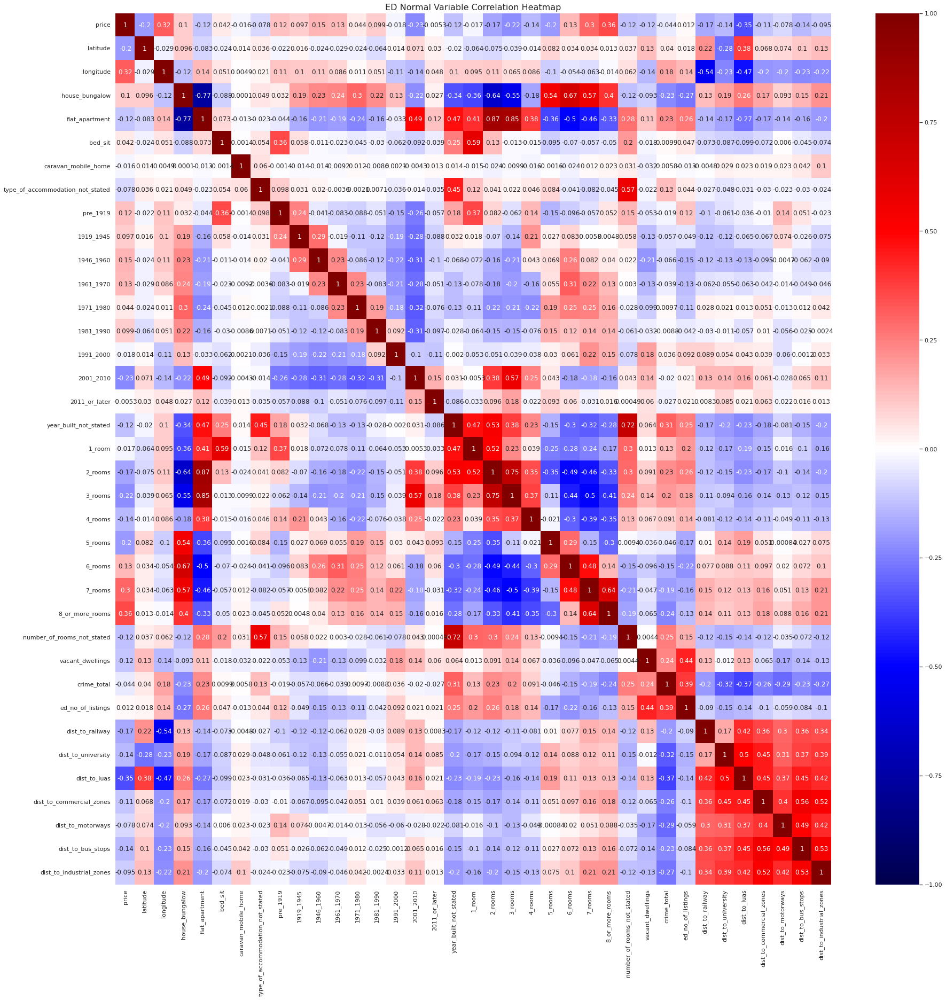

In [52]:
# Check for high correlations between features 
sns.set(rc={'figure.figsize':(30,30)})
ax = plt.axes()
ax.set_title("ED Normal Variable Correlation Heatmap", fontsize = 16)
sns.heatmap(ED_ppr_normal.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1)

#### *Variance Inflation Factor* 

In [53]:
vif_ED_ppr_normal_X = ED_ppr_normal[[ #'month_year', 'latitude', 'longitude', 'geometry', 'electoral_divisions',
                                                                          
                                        'house_bungalow', 'flat_apartment', 'bed_sit', 'caravan_mobile_home','type_of_accommodation_not_stated', 
                                     
                                        'pre_1919', '1919_1945', '1946_1960', '1961_1970', '1971_1980', '1981_1990', '1991_2000','2001_2010', '2011_or_later', 'year_built_not_stated', 

                                        '1_room', '2_rooms', '3_rooms', '4_rooms', '5_rooms', '6_rooms', '7_rooms','8_or_more_rooms', 'number_of_rooms_not_stated', 

                                        'vacant_dwellings',
                                        'crime_total',

                                        # 'range_ed_no_of_listings', 
                                        'ed_no_of_listings',

                                        'dist_to_railway', 'dist_to_university', 'dist_to_luas',
                                        'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
                                        'dist_to_industrial_zones']].astype(float)
vif_ED_ppr_normal_y = ED_ppr_normal["price"].astype(int)
vif_ED_ppr_normal_X = sm.add_constant(vif_ED_ppr_normal_X)


# Run VIF for all variable in original dataframe
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(vif_ED_ppr_normal_X.values, i) for i in range(vif_ED_ppr_normal_X.shape[1])]
vif["features"] = vif_ED_ppr_normal_X.columns
vif.round(1)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only

/usr/local/lib/python3.7/dist-packages/statsmodels/stats/outliers_influence.py:185: RuntimeWarning:

divide by zero encountered in double_scalars



,VIF Factor,features
0,26.60000,const
1,inf,house_bungalow
2,inf,flat_apartment
3,inf,bed_sit
4,1.00000,caravan_mobile_home
5,inf,type_of_accommodation_not_stated
6,inf,pre_1919
7,inf,1919_1945
8,inf,1946_1960
9,inf,1961_1970


#### *Reducing Variables* 

In [54]:
ED_ppr_normal['pre_1991'] =  ED_ppr_normal['year_built_not_stated'] + ED_ppr_normal['pre_1919'] + ED_ppr_normal['1919_1945'] + ED_ppr_normal['1946_1960'] + ED_ppr_normal['1961_1970'] + ED_ppr_normal['1971_1980'] + ED_ppr_normal['1981_1990'] 
ED_ppr_normal['1991_2010'] = ED_ppr_normal['1991_2000'] + ED_ppr_normal['2001_2010'] 

ED_ppr_normal['small_property'] = ED_ppr_normal['1_room'] + ED_ppr_normal['2_rooms'] + ED_ppr_normal['3_rooms'] + ED_ppr_normal['number_of_rooms_not_stated']
ED_ppr_normal['medium_property'] =  + ED_ppr_normal['4_rooms'] +ED_ppr_normal['5_rooms']
ED_ppr_normal['large_property'] =  + ED_ppr_normal['6_rooms'] + ED_ppr_normal['7_rooms'] + ED_ppr_normal['8_or_more_rooms'] 

ED_ppr_normal['flat_apartment'] = ED_ppr_normal['flat_apartment'] + ED_ppr_normal['bed_sit'] 
ED_ppr_normal['other_accomodation'] = LEA_ppr_normal['caravan_mobile_home'] + ED_ppr_normal['type_of_accommodation_not_stated'] 

/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### *Variance Inflation Factor with Reduced Variables* 

In [55]:
vif_ED_ppr_normal_X = ED_ppr_normal[[ #'month_year', 'latitude', 'longitude', 'geometry','electoral_divisions',
                                                                          
                                        # 'house_bungalow', 'flat_apartment', 'other_accomodation',
                                     
                                        'pre_1991', 
                                     '1991_2010', 
                                     #'2011_or_later',
                                     
                                        'small_property', 
                                    #  'medium_property', 
                                     'large_property',

                                        'vacant_dwellings',
                                        'crime_total',

                                        # 'range_ed_no_of_listings', 
                                        'ed_no_of_listings',

                                        'dist_to_railway', 'dist_to_university', 'dist_to_luas',
                                        'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
                                        'dist_to_industrial_zones']].astype(float)
vif_ED_ppr_normal_y = ED_ppr_normal["price"].astype(int)
vif_ED_ppr_normal_X = sm.add_constant(vif_ED_ppr_normal_X)


# Run VIF for all variable in original dataframe
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(vif_ED_ppr_normal_X.values, i) for i in range(vif_ED_ppr_normal_X.shape[1])]
vif["features"] = vif_ED_ppr_normal_X.columns
vif.round(1)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



,VIF Factor,features
0,24.50000,const
1,4.10000,pre_1991
2,4.60000,1991_2010
3,2.90000,small_property
4,2.50000,large_property
5,1.60000,vacant_dwellings
6,1.50000,crime_total
7,1.50000,ed_no_of_listings
8,1.40000,dist_to_railway
9,1.60000,dist_to_university


#### *Boxplots*

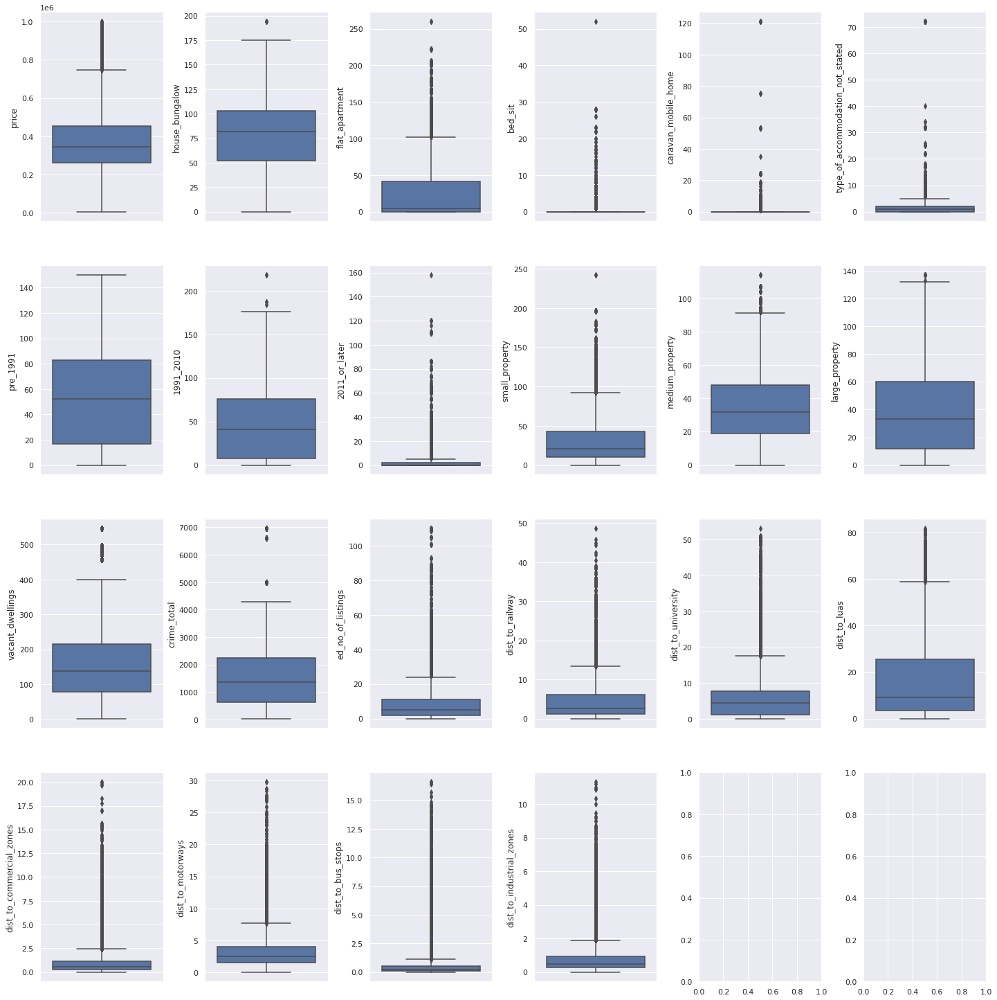

In [56]:
fig, axs = plt.subplots(ncols=6, nrows=4, figsize=(20, 20))
index = 0
axs = axs.flatten()
for k,v in ED_ppr_normal[['price', 
                  #'month_year', 'latitude', 'longitude', 'geometry','electoral_divisions',
                  'house_bungalow', 'flat_apartment', 'bed_sit', 'caravan_mobile_home',
                  'type_of_accommodation_not_stated', 

                  #  'pre_1919', '1919_1945', '1946_1960', '1961_1970', '1971_1980', '1981_1990', '1991_2000','2001_2010', '2011_or_later', 'year_built_not_stated', 

                  #  '1_room','2_rooms', '3_rooms', '4_rooms', '5_rooms', '6_rooms', '7_rooms', '8_or_more_rooms', 'number_of_rooms_not_stated',
                  'pre_1991', '1991_2010',  '2011_or_later', 
                  'small_property', 'medium_property', 'large_property',
                  'vacant_dwellings',

                  'crime_total', 

                  #  'range_ed_no_of_listings', 
                  'ed_no_of_listings',
                  'dist_to_railway', 'dist_to_university', 'dist_to_luas',
                  'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
                  'dist_to_industrial_zones']].items():
    sns.boxplot(y=v, ax=axs[index])
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)


#### *Histogram*

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f748ef5cc90>,
      dtype=object)

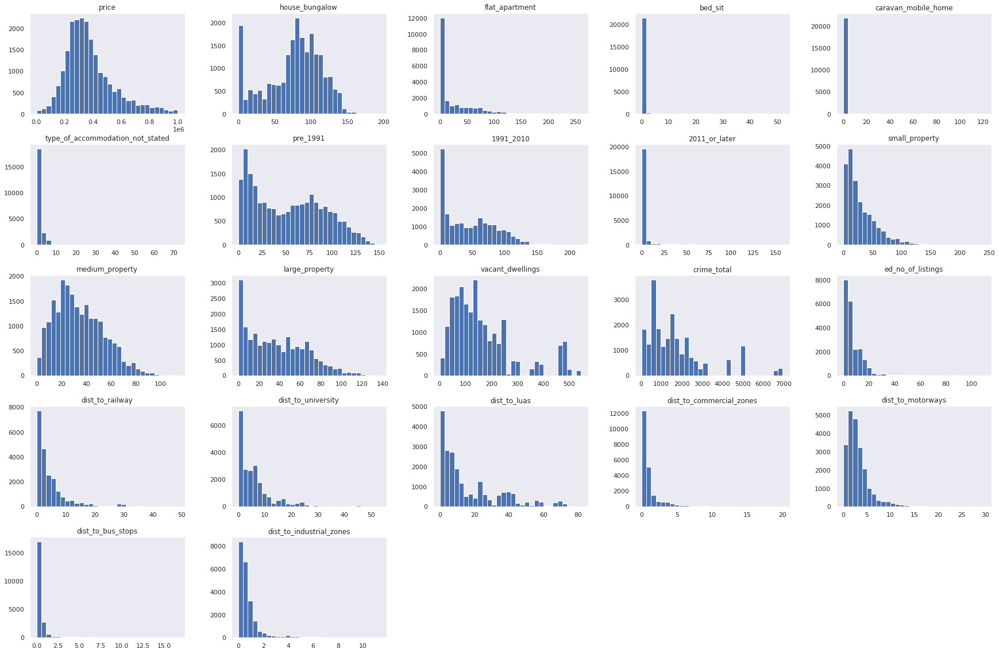

In [57]:
sns.set()
ED_ppr_normal[['price', 
                  #'month_year', 'latitude', 'longitude', 'geometry', 'electoral_divisions',
                  'house_bungalow', 'flat_apartment', 'bed_sit', 'caravan_mobile_home',
                  'type_of_accommodation_not_stated', 

                  #  'pre_1919', '1919_1945', '1946_1960', '1961_1970', '1971_1980', '1981_1990', '1991_2000','2001_2010', '2011_or_later', 'year_built_not_stated', 

                  #  '1_room','2_rooms', '3_rooms', '4_rooms', '5_rooms', '6_rooms', '7_rooms', '8_or_more_rooms', 'number_of_rooms_not_stated',
                  'pre_1991', '1991_2010',  '2011_or_later', 
                  'small_property', 'medium_property', 'large_property',
                  'vacant_dwellings',

                  'crime_total', 

                  #  'range_ed_no_of_listings', 
                  'ed_no_of_listings',
                  'dist_to_railway', 'dist_to_university', 'dist_to_luas',
                  'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
                  'dist_to_industrial_zones']].hist(grid=False, figsize=(30, 20), bins=30)


#### *Observations*

## ED Percent

#### *Skewness and Kutosis*

In [58]:
# review skewness and kurtosis
ED_ppr_percent.agg(['skew', 'kurtosis']).transpose()

,skew,kurtosis
price,1.05378,1.15787
latitude,0.80344,2.19072
longitude,-1.19216,1.00890
house_bungalow_%,-1.16280,-0.06208
flat_apartment_%,1.21656,0.08166
bed_sit_%,11.91335,189.35908
caravan_mobile_home_%,19.25665,490.82558
type_of_accommodation_not_statd_%,8.08435,120.39924
pre_1919_%,2.97770,9.51233
1919_1945_%,3.63190,15.23310


#### *Correlation*

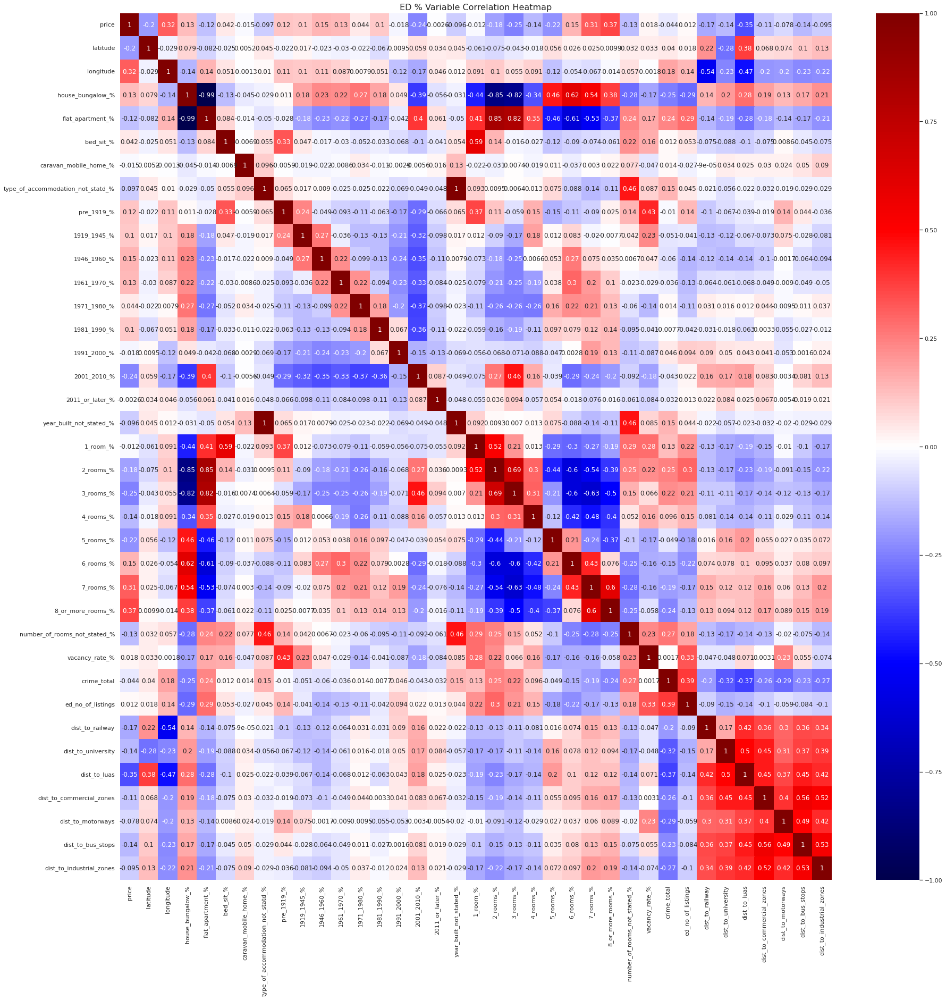

In [59]:
# Check for high correlations between features 
sns.set(rc={'figure.figsize':(30,30)})
ax = plt.axes()
ax.set_title("ED % Variable Correlation Heatmap", fontsize = 16)
sns.heatmap(ED_ppr_percent.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1)


#### *Variance Inflation Factor*

In [60]:
vif_ED_ppr_percent_X = ED_ppr_percent[[ #'month_year', 'latitude', 'longitude', 'geometry', 'electoral_divisions',
                                        'house_bungalow_%', 'flat_apartment_%', 'bed_sit_%',
                                        'caravan_mobile_home_%', 'type_of_accommodation_not_statd_%',
                                       
                                        'pre_1919_%', '1919_1945_%', '1946_1960_%', '1961_1970_%',
                                        '1971_1980_%', '1981_1990_%', '1991_2000_%', '2001_2010_%',
                                        '2011_or_later_%', 'year_built_not_stated_%', 
                                       
                                        '1_room_%', '2_rooms_%','3_rooms_%', '4_rooms_%', '5_rooms_%', '6_rooms_%', '7_rooms_%',
                                        '8_or_more_rooms_%', 'number_of_rooms_not_stated_%', 
                                       
                                        'vacancy_rate_%',
                                        'crime_total', 
                                        
                                        # 'range_ed_no_of_listings', 
                                        'ed_no_of_listings',
                                        
                                        'dist_to_railway', 'dist_to_university', 'dist_to_luas',
                                        'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
                                        'dist_to_industrial_zones']].astype(float)
vif_ED_ppr_percent_y = ED_ppr_percent["price"].astype(int)
vif_ED_ppr_percent_X = sm.add_constant(vif_ED_ppr_percent_X)


# Run VIF for all variable in original dataframe
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(vif_ED_ppr_percent_X.values, i) for i in range(vif_ED_ppr_percent_X.shape[1])]
vif["features"] = vif_ED_ppr_percent_X.columns
vif.round(1)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



,VIF Factor,features
0,90021.30000,const
1,9109.60000,house_bungalow_%
2,9028.00000,flat_apartment_%
3,15.80000,bed_sit_%
4,26.80000,caravan_mobile_home_%
5,630.00000,type_of_accommodation_not_statd_%
6,9.70000,pre_1919_%
7,7.90000,1919_1945_%
8,11.90000,1946_1960_%
9,7.80000,1961_1970_%


#### *Reducing Variables*

In [61]:
ED_ppr_percent['pre_1991_%'] =  ED_ppr_percent['year_built_not_stated_%'] + ED_ppr_percent['pre_1919_%'] + ED_ppr_percent['1919_1945_%'] + ED_ppr_percent['1946_1960_%'] + ED_ppr_percent['1961_1970_%'] + ED_ppr_percent['1971_1980_%'] + ED_ppr_percent['1981_1990_%'] 
ED_ppr_percent['1991_2010_%'] = ED_ppr_percent['1991_2000_%'] + ED_ppr_percent['2001_2010_%'] 

ED_ppr_percent['small_property_%'] = ED_ppr_percent['1_room_%'] + ED_ppr_percent['2_rooms_%'] + ED_ppr_percent['3_rooms_%'] + ED_ppr_percent['number_of_rooms_not_stated_%']
ED_ppr_percent['medium_property_%'] = ED_ppr_percent['4_rooms_%'] + ED_ppr_percent['5_rooms_%']
ED_ppr_percent['large_property_%'] = ED_ppr_percent['6_rooms_%'] + ED_ppr_percent['7_rooms_%'] + ED_ppr_percent['8_or_more_rooms_%'] 


ED_ppr_percent['flat_apartment_%'] = ED_ppr_percent['flat_apartment_%'] + ED_ppr_percent['bed_sit_%'] 
ED_ppr_percent['other_accomodation_%'] = ED_ppr_percent['caravan_mobile_home_%'] + ED_ppr_percent['type_of_accommodation_not_statd_%'] 

/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### *Variance Inflation Factor with Reduced Variables*

In [62]:
vif_ED_ppr_percent_X = ED_ppr_percent[[ #'month_year','latitude', 'longitude', 'geometry', 'electoral_divisions',
                                       
                                        # 'house_bungalow_%', 'flat_apartment_%', 'other_accomodation_%',
                                       
                                        'pre_1991_%', 
                                       '1991_2010_%', 
                                       #'2011_or_later_%',
                                     
                                        'small_property_%', 
                                      #  'medium_property_%', 
                                       'large_property_%',
                                       
                                        'vacancy_rate_%',
                                        'crime_total', 
                                        
                                        # 'range_ed_no_of_listings', 
                                        'ed_no_of_listings',
                                        
                                        'dist_to_railway', 'dist_to_university', 'dist_to_luas',
                                        'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
                                        'dist_to_industrial_zones']].astype(float)
vif_ED_ppr_percent_y = ED_ppr_percent["price"].astype(int)
vif_ED_ppr_percent_X = sm.add_constant(vif_ED_ppr_percent_X)


# Run VIF for all variable in original dataframe
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(vif_ED_ppr_percent_X.values, i) for i in range(vif_ED_ppr_percent_X.shape[1])]
vif["features"] = vif_ED_ppr_percent_X.columns
vif.round(1)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



,VIF Factor,features
0,133.20000,const
1,14.30000,pre_1991_%
2,13.10000,1991_2010_%
3,3.30000,small_property_%
4,2.60000,large_property_%
5,1.50000,vacancy_rate_%
6,1.50000,crime_total
7,1.40000,ed_no_of_listings
8,1.40000,dist_to_railway
9,1.60000,dist_to_university


#### *Boxplots*

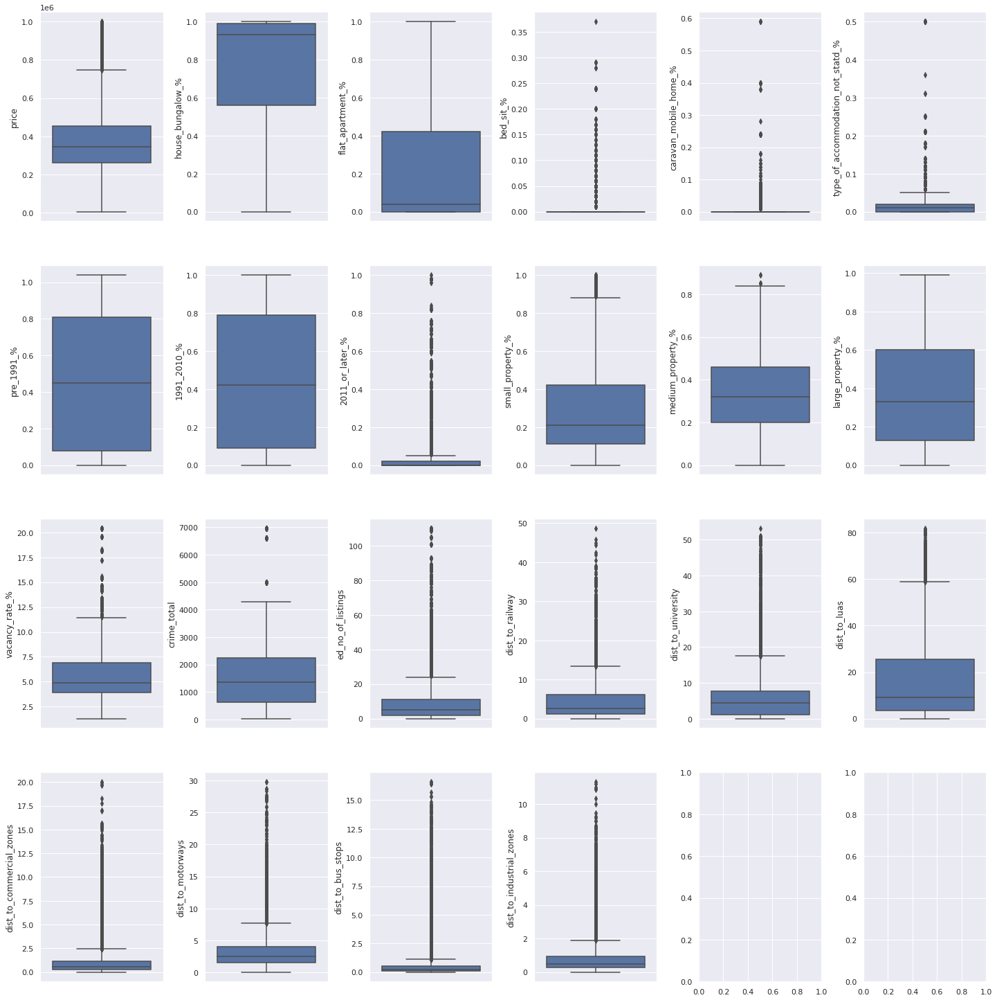

In [63]:
fig, axs = plt.subplots(ncols=6, nrows=4, figsize=(20, 20))
index = 0
axs = axs.flatten()
for k,v in ED_ppr_percent[['price',
    #'month_year', 'latitude', 'longitude', 'geometry', 'electoral_divisions',
        
        'house_bungalow_%', 'flat_apartment_%', 'bed_sit_%',
        'caravan_mobile_home_%', 'type_of_accommodation_not_statd_%',
        
        'pre_1991_%', '1991_2010_%', '2011_or_later_%',
      
        'small_property_%', 'medium_property_%', 'large_property_%',
        
        'vacancy_rate_%',
        'crime_total', 
        
        # 'range_ed_no_of_listings', 
        'ed_no_of_listings',
        
        'dist_to_railway', 'dist_to_university', 'dist_to_luas',
        'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
        'dist_to_industrial_zones'
                                        ]].items():
    sns.boxplot(y=v, ax=axs[index])
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)


#### *Histogram*

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f748f1f7d50>,
      dtype=object)

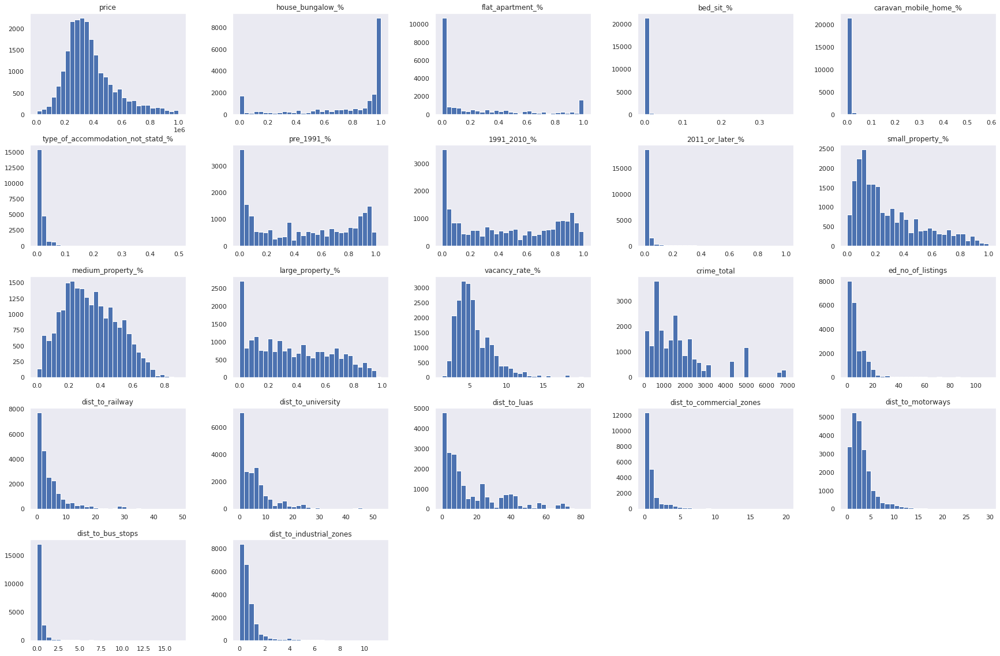

In [64]:
sns.set()
ED_ppr_percent[['price', 
                  #'month_year', 'latitude', 'longitude', 'geometry', 'electoral_divisions',

       'house_bungalow_%', 'flat_apartment_%', 'bed_sit_%','caravan_mobile_home_%', 'type_of_accommodation_not_statd_%',

      #  'pre_1919_%', '1919_1945_%', '1946_1960_%', '1961_1970_%', '1971_1980_%', '1981_1990_%', '1991_2000_%', '2001_2010_%', '2011_or_later_%', 'year_built_not_stated_%',
       
      #  '1_room_%', '2_rooms_%','3_rooms_%', '4_rooms_%', '5_rooms_%', '6_rooms_%', '7_rooms_%','8_or_more_rooms_%', 'number_of_rooms_not_stated_%', 

       'pre_1991_%', '1991_2010_%','2011_or_later_%', 
       
       'small_property_%', 'medium_property_%', 'large_property_%',
 

       'vacancy_rate_%',

       'crime_total', 
       
       'range_ed_no_of_listings', 'ed_no_of_listings',

       'dist_to_railway', 'dist_to_university', 'dist_to_luas',
       'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
       'dist_to_industrial_zones']].hist(grid=False, figsize=(30, 20), bins=30)


#### *Observations*

## LEA Normal

#### *Skewness and Kutosis*

In [65]:
# review skewness and kurtosis
LEA_ppr_normal.agg(['skew', 'kurtosis']).transpose()

,skew,kurtosis
price,1.05378,1.15787
latitude,0.80344,2.19072
longitude,-1.19216,1.00890
house_bungalow,-0.48759,-0.51371
flat_apartment,1.78463,3.25287
bed_sit,13.18467,253.88598
caravan_mobile_home,31.51954,1267.34193
type_of_accommodation_not_stated,11.47363,210.87380
pre_1919,3.17321,11.49807
1919_1945,3.80300,17.56492


#### *Correlation*

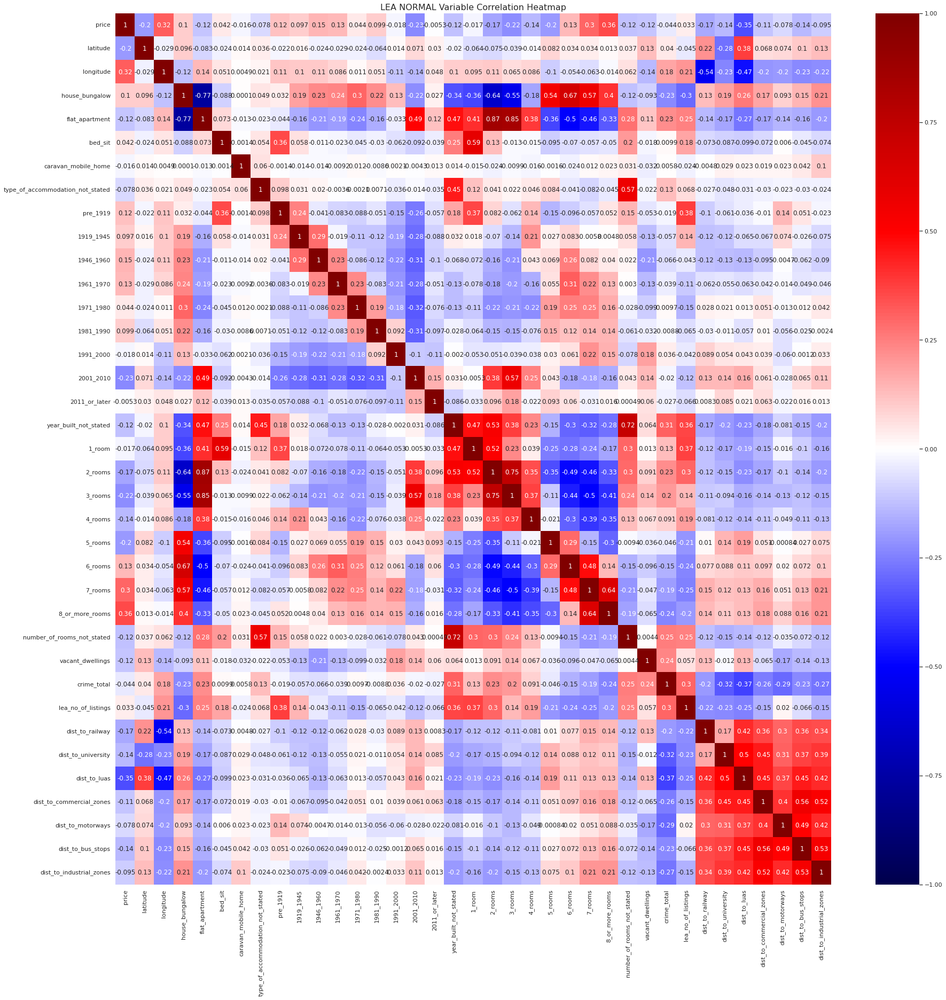

In [66]:
# Check for high correlations between features 
sns.set(rc={'figure.figsize':(30,30)})
ax = plt.axes()
ax.set_title("LEA NORMAL Variable Correlation Heatmap", fontsize = 16)
sns.heatmap(LEA_ppr_normal.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1)


#### *Variance Inflation Factor*

In [67]:
vif_LEA_ppr_normal_X = LEA_ppr_normal[[ #'month_year', 'geometry', 'lea',
                                                                          
                                        'house_bungalow', 'flat_apartment', 'bed_sit', 'caravan_mobile_home','type_of_accommodation_not_stated', 
                                     
                                        'pre_1919', '1919_1945', '1946_1960', '1961_1970', '1971_1980', '1981_1990', '1991_2000','2001_2010', '2011_or_later', 'year_built_not_stated', 

                                        '1_room', '2_rooms', '3_rooms', '4_rooms', '5_rooms', '6_rooms', '7_rooms','8_or_more_rooms', 'number_of_rooms_not_stated', 

                                        'vacant_dwellings',
                                        'crime_total',

                                        # 'range_ed_no_of_listings', 
                                        'lea_no_of_listings',

                                        'dist_to_railway', 'dist_to_university', 'dist_to_luas',
                                        'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
                                        'dist_to_industrial_zones']].astype(float)
vif_LEA_ppr_normal_y = LEA_ppr_normal["price"].astype(int)
vif_LEA_ppr_normal_X = sm.add_constant(vif_LEA_ppr_normal_X)


# Run VIF for all variable in original dataframe
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(vif_LEA_ppr_normal_X.values, i) for i in range(vif_LEA_ppr_normal_X.shape[1])]
vif["features"] = vif_LEA_ppr_normal_X.columns
vif.round(1)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only

/usr/local/lib/python3.7/dist-packages/statsmodels/stats/outliers_influence.py:185: RuntimeWarning:

divide by zero encountered in double_scalars



,VIF Factor,features
0,27.20000,const
1,inf,house_bungalow
2,inf,flat_apartment
3,inf,bed_sit
4,1.00000,caravan_mobile_home
5,inf,type_of_accommodation_not_stated
6,inf,pre_1919
7,inf,1919_1945
8,inf,1946_1960
9,inf,1961_1970


#### *Reducing Variables*

In [68]:
LEA_ppr_normal['pre_1991'] = LEA_ppr_normal['year_built_not_stated'] + LEA_ppr_normal['pre_1919'] + LEA_ppr_normal['1919_1945'] + LEA_ppr_normal['1946_1960'] + LEA_ppr_normal['1961_1970'] + LEA_ppr_normal['1971_1980'] + LEA_ppr_normal['1981_1990'] 
LEA_ppr_normal['1991_2010'] = LEA_ppr_normal['1991_2000'] + LEA_ppr_normal['2001_2010']

LEA_ppr_normal['small_property'] = LEA_ppr_normal['1_room'] + LEA_ppr_normal['2_rooms'] + LEA_ppr_normal['3_rooms'] + LEA_ppr_normal['number_of_rooms_not_stated']
LEA_ppr_normal['medium_property'] =  LEA_ppr_normal['4_rooms'] + LEA_ppr_normal['5_rooms']
LEA_ppr_normal['large_property'] =  LEA_ppr_normal['6_rooms'] + LEA_ppr_normal['7_rooms'] + LEA_ppr_normal['8_or_more_rooms'] 

LEA_ppr_normal['flat_apartment'] = LEA_ppr_normal['flat_apartment'] + LEA_ppr_normal['bed_sit'] 
LEA_ppr_normal['other_accomodation'] = LEA_ppr_normal['caravan_mobile_home'] + LEA_ppr_normal['type_of_accommodation_not_stated'] 

/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### *Variance Inflation Factor with Reduced Variables*

In [69]:
vif_LEA_ppr_normal_X = LEA_ppr_normal[[ #'month_year', 'latitude', 'longitude', 'geometry', 'lea',
                                                                          
                                        # 'house_bungalow', 'flat_apartment', 'other_accomodation',  
                                     
                                        'pre_1991', '1991_2010', #'2011_or_later',
                                     
                                        'small_property', #'medium_property', 
                                       'large_property',

                                        'vacant_dwellings',
                                        'crime_total',

                                        # 'range_lea_no_of_listings', 
                                        'lea_no_of_listings',

                                        'dist_to_railway', 'dist_to_university', 'dist_to_luas',
                                        'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
                                        'dist_to_industrial_zones']].astype(float)
vif_LEA_ppr_normal_y = LEA_ppr_normal["price"].astype(int)
vif_LEA_ppr_normal_X = sm.add_constant(vif_LEA_ppr_normal_X)


# Run VIF for all variable in original dataframe
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(vif_LEA_ppr_normal_X.values, i) for i in range(vif_LEA_ppr_normal_X.shape[1])]
vif["features"] = vif_LEA_ppr_normal_X.columns
vif.round(1)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



,VIF Factor,features
0,25.10000,const
1,4.10000,pre_1991
2,4.70000,1991_2010
3,2.90000,small_property
4,2.50000,large_property
5,1.30000,vacant_dwellings
6,1.40000,crime_total
7,1.30000,lea_no_of_listings
8,1.50000,dist_to_railway
9,1.60000,dist_to_university


#### *Boxplots*

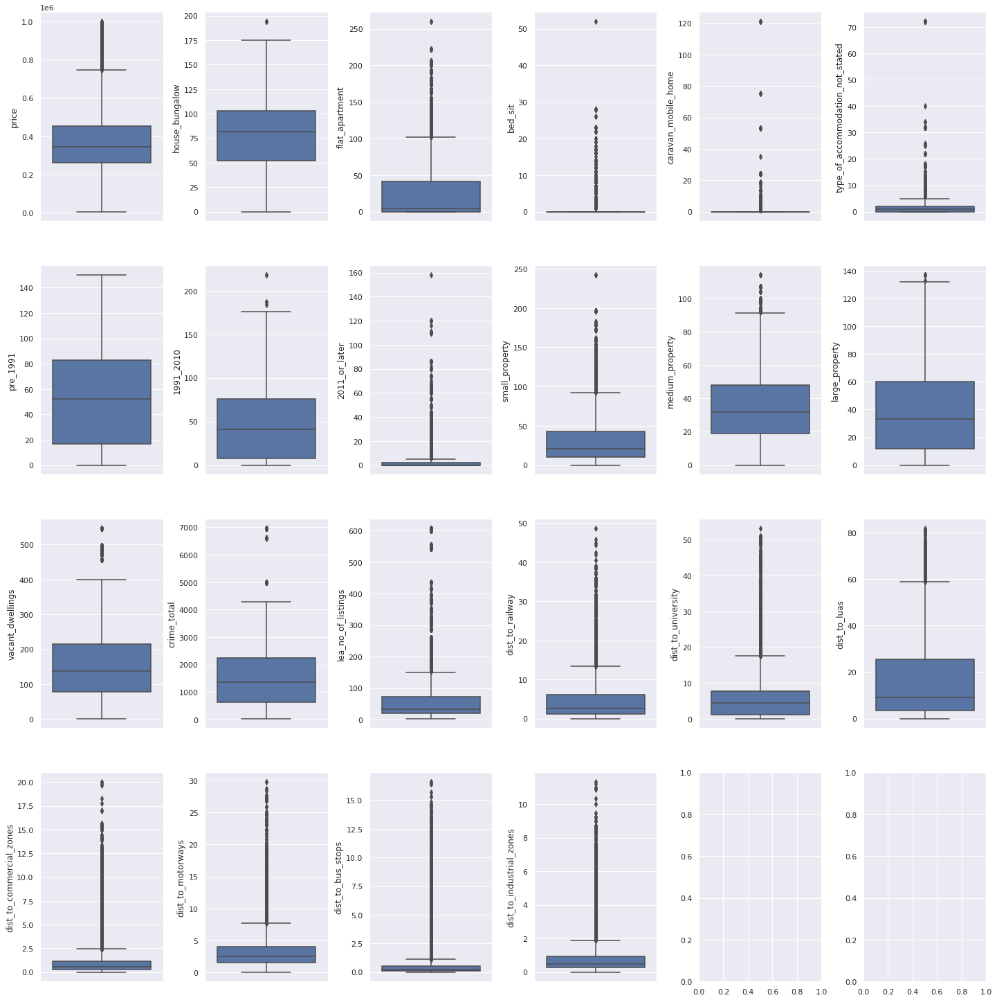

In [70]:
fig, axs = plt.subplots(ncols=6, nrows=4, figsize=(20, 20))
index = 0
axs = axs.flatten()
for k,v in LEA_ppr_normal[['price', 
                  #'month_year', 'geometry', 'lea',
                  'house_bungalow', 'flat_apartment', 'bed_sit', 'caravan_mobile_home',
                  'type_of_accommodation_not_stated', 

                  #  'pre_1919', '1919_1945', '1946_1960', '1961_1970', '1971_1980', '1981_1990', '1991_2000','2001_2010', '2011_or_later', 'year_built_not_stated', 

                  #  '1_room','2_rooms', '3_rooms', '4_rooms', '5_rooms', '6_rooms', '7_rooms', '8_or_more_rooms', 'number_of_rooms_not_stated',
                  'pre_1991', '1991_2010',  '2011_or_later', 
                  'small_property', 'medium_property', 'large_property',
                  'vacant_dwellings',

                  'crime_total', 

                  #  'range_lea_no_of_listings', 
                  'lea_no_of_listings',
                  'dist_to_railway', 'dist_to_university', 'dist_to_luas',
                  'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
                  'dist_to_industrial_zones']].items():
    sns.boxplot(y=v, ax=axs[index])
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)


#### *Histogram*

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f748af95890>,
      dtype=object)

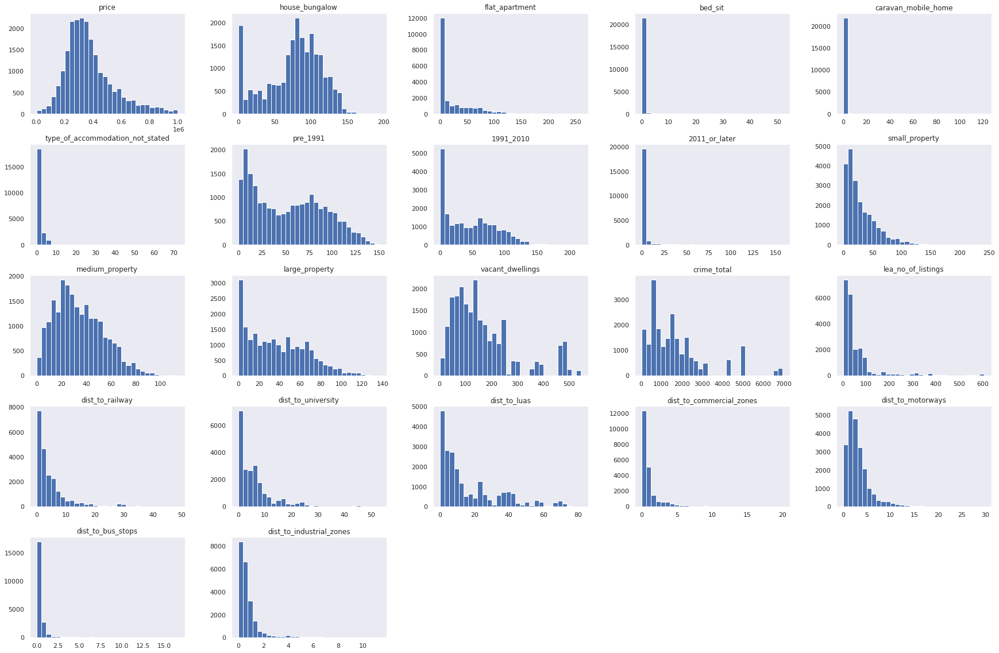

In [71]:
LEA_ppr_normal[['price', 
                  #'month_year', 'latitude', 'longitude', 'geometry', 'lea',
                  'house_bungalow', 'flat_apartment', 'bed_sit', 'caravan_mobile_home',
                  'type_of_accommodation_not_stated', 

                  #  'pre_1919', '1919_1945', '1946_1960', '1961_1970', '1971_1980', '1981_1990', '1991_2000','2001_2010', '2011_or_later', 'year_built_not_stated', 

                  #  '1_room','2_rooms', '3_rooms', '4_rooms', '5_rooms', '6_rooms', '7_rooms', '8_or_more_rooms', 'number_of_rooms_not_stated',
                  'pre_1991', '1991_2010',  '2011_or_later', 
                  'small_property', 'medium_property', 'large_property',
                  'vacant_dwellings',

                  'crime_total', 

                  #  'range_lea_no_of_listings', 
                  'lea_no_of_listings',
                  'dist_to_railway', 'dist_to_university', 'dist_to_luas',
                  'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
                  'dist_to_industrial_zones']].hist(grid=False, figsize=(30, 20), bins=30)

#### *Observations*

## LEA Percent

### *Skewness and Kutosis* bold text

In [72]:
# review skewness and kurtosis
LEA_ppr_percent.agg(['skew', 'kurtosis']).transpose()

,skew,kurtosis
price,1.05378,1.15787
latitude,0.80344,2.19072
longitude,-1.19216,1.00890
house_bungalow_%,-1.16280,-0.06208
flat_apartment_%,1.21656,0.08166
bed_sit_%,11.91335,189.35908
caravan_mobile_home_%,19.25665,490.82558
type_of_accommodation_not_statd_%,8.08435,120.39924
pre_1919_%,2.97770,9.51233
1919_1945_%,3.63190,15.23310


### *Correlation*

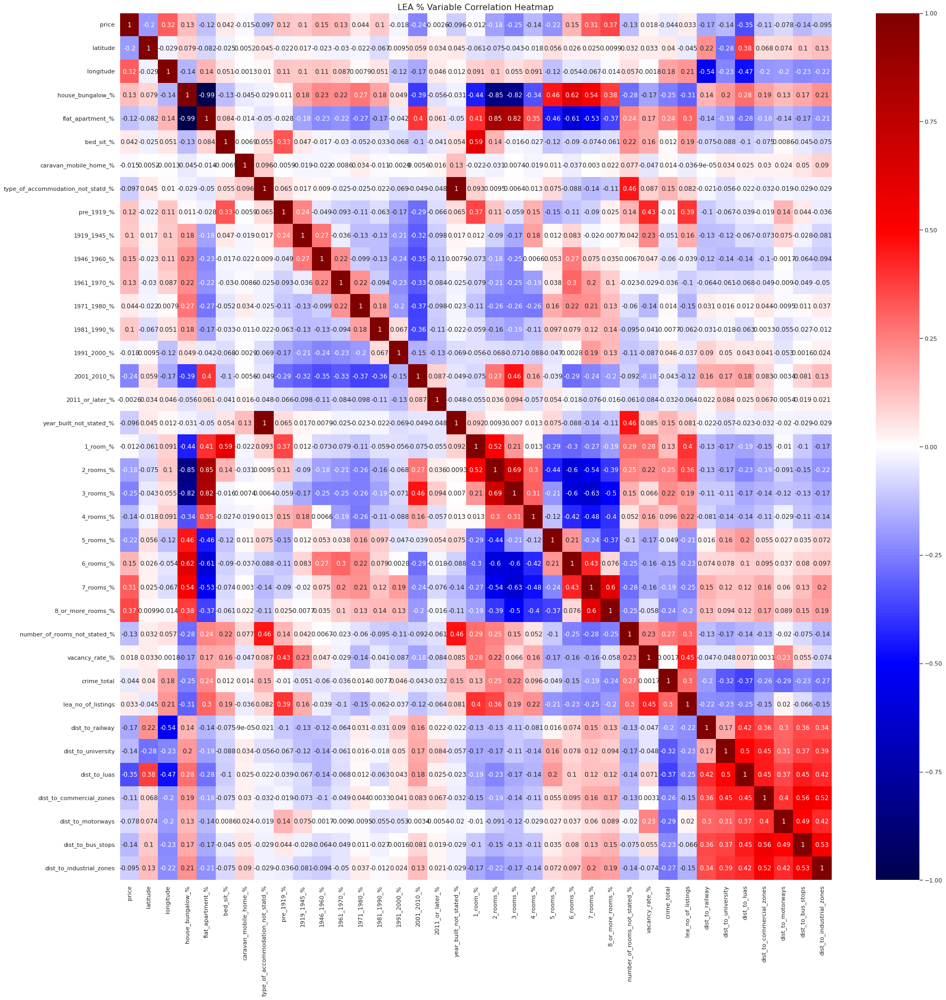

In [73]:
# Check for high correlations between features 
sns.set(rc={'figure.figsize':(30,30)})
ax = plt.axes()
ax.set_title("LEA % Variable Correlation Heatmap", fontsize = 16)
sns.heatmap(LEA_ppr_percent.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1)

### *Variance Inflation Factor*

In [74]:
vif_LEA_ppr_percent_X = LEA_ppr_percent[[ #'month_year', 'latitude', 'longitude', 'geometry', 'lea',
                                                                          
    'house_bungalow_%', 'flat_apartment_%', 'bed_sit_%', 
    'caravan_mobile_home_%', 'type_of_accommodation_not_statd_%',

    'pre_1919_%', '1919_1945_%', '1946_1960_%', '1961_1970_%', '1971_1980_%', 
    '1981_1990_%', '1991_2000_%', '2001_2010_%', '2011_or_later_%', 'year_built_not_stated_%', 
    
    '1_room_%', '2_rooms_%', '3_rooms_%', '4_rooms_%', '5_rooms_%', 
    '6_rooms_%', '7_rooms_%',  '8_or_more_rooms_%', 'number_of_rooms_not_stated_%', 
    
    'vacancy_rate_%',
    'crime_total',

    #  'range_lea_listings', 
    'lea_no_of_listings',

    'dist_to_railway', 'dist_to_university', 'dist_to_luas',
    'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
    'dist_to_industrial_zones']].astype(float)
vif_LEA_ppr_percent_y = LEA_ppr_percent["price"].astype(int)
vif_LEA_ppr_percent_X = sm.add_constant(vif_LEA_ppr_percent_X)


# Run VIF for all variable in original dataframe
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(vif_LEA_ppr_percent_X.values, i) for i in range(vif_LEA_ppr_percent_X.shape[1])]
vif["features"] = vif_LEA_ppr_percent_X.columns
vif.round(1)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



,VIF Factor,features
0,90018.60000,const
1,9110.40000,house_bungalow_%
2,9028.80000,flat_apartment_%
3,15.80000,bed_sit_%
4,26.80000,caravan_mobile_home_%
5,630.00000,type_of_accommodation_not_statd_%
6,9.70000,pre_1919_%
7,7.90000,1919_1945_%
8,11.90000,1946_1960_%
9,7.80000,1961_1970_%


### *Reducing Variables*

In [75]:
LEA_ppr_percent['pre_1991_%'] = LEA_ppr_percent['year_built_not_stated_%'] + LEA_ppr_percent['pre_1919_%'] + LEA_ppr_percent['1919_1945_%'] + LEA_ppr_percent['1946_1960_%'] + LEA_ppr_percent['1961_1970_%'] + LEA_ppr_percent['1971_1980_%'] + LEA_ppr_percent['1981_1990_%'] 
LEA_ppr_percent['1991_2010_%'] = LEA_ppr_percent['1991_2000_%'] + LEA_ppr_percent['2001_2010_%'] 

LEA_ppr_percent['small_property_%'] = LEA_ppr_percent['1_room_%'] + LEA_ppr_percent['2_rooms_%'] + LEA_ppr_percent['number_of_rooms_not_stated_%'] +LEA_ppr_percent['3_rooms_%'] 
LEA_ppr_percent['medium_property_%'] =  LEA_ppr_percent['4_rooms_%'] + LEA_ppr_percent['5_rooms_%'] 
LEA_ppr_percent['large_property_%'] =LEA_ppr_percent['6_rooms_%'] + LEA_ppr_percent['7_rooms_%'] + LEA_ppr_percent['8_or_more_rooms_%'] 

LEA_ppr_percent['flat_apartment_%'] = LEA_ppr_percent['flat_apartment_%'] + LEA_ppr_percent['bed_sit_%'] 
LEA_ppr_percent['other_accomodation_%'] = LEA_ppr_percent['caravan_mobile_home_%'] + LEA_ppr_percent['type_of_accommodation_not_statd_%'] 

/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### *Variance Inflation Factor with Reduced Variables*

In [76]:
vif_LEA_ppr_percent_X = LEA_ppr_percent[[ #'month_year', 'latitude', 'longitude', 'geometry', 'lea',
                                       
                                        # 'house_bungalow_%', 'flat_apartment_%', 'other_accomodation_%',
                                       
                                        'pre_1991_%', 
                                         '1991_2010_%', 
                                         #'2011_or_later_%',
                                     
                                        'small_property_%', #'medium_property_%', 
                                         'large_property_%',
                                       
                                        'vacancy_rate_%',
                                        'crime_total', 
                                        
                                        # 'range_lea_no_of_listings', 
                                        'lea_no_of_listings',
                                        
                                        'dist_to_railway', 'dist_to_university', 'dist_to_luas',
                                        'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
                                        'dist_to_industrial_zones']].astype(float)
vif_LEA_ppr_percent_y = LEA_ppr_percent["price"].astype(int)
vif_LEA_ppr_percent_X = sm.add_constant(vif_LEA_ppr_percent_X)


# Run VIF for all variable in original dataframe
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(vif_LEA_ppr_percent_X.values, i) for i in range(vif_LEA_ppr_percent_X.shape[1])]
vif["features"] = vif_LEA_ppr_percent_X.columns
vif.round(1)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



,VIF Factor,features
0,133.20000,const
1,14.20000,pre_1991_%
2,13.10000,1991_2010_%
3,3.30000,small_property_%
4,2.60000,large_property_%
5,1.50000,vacancy_rate_%
6,1.40000,crime_total
7,1.60000,lea_no_of_listings
8,1.40000,dist_to_railway
9,1.60000,dist_to_university


### *Boxplots*

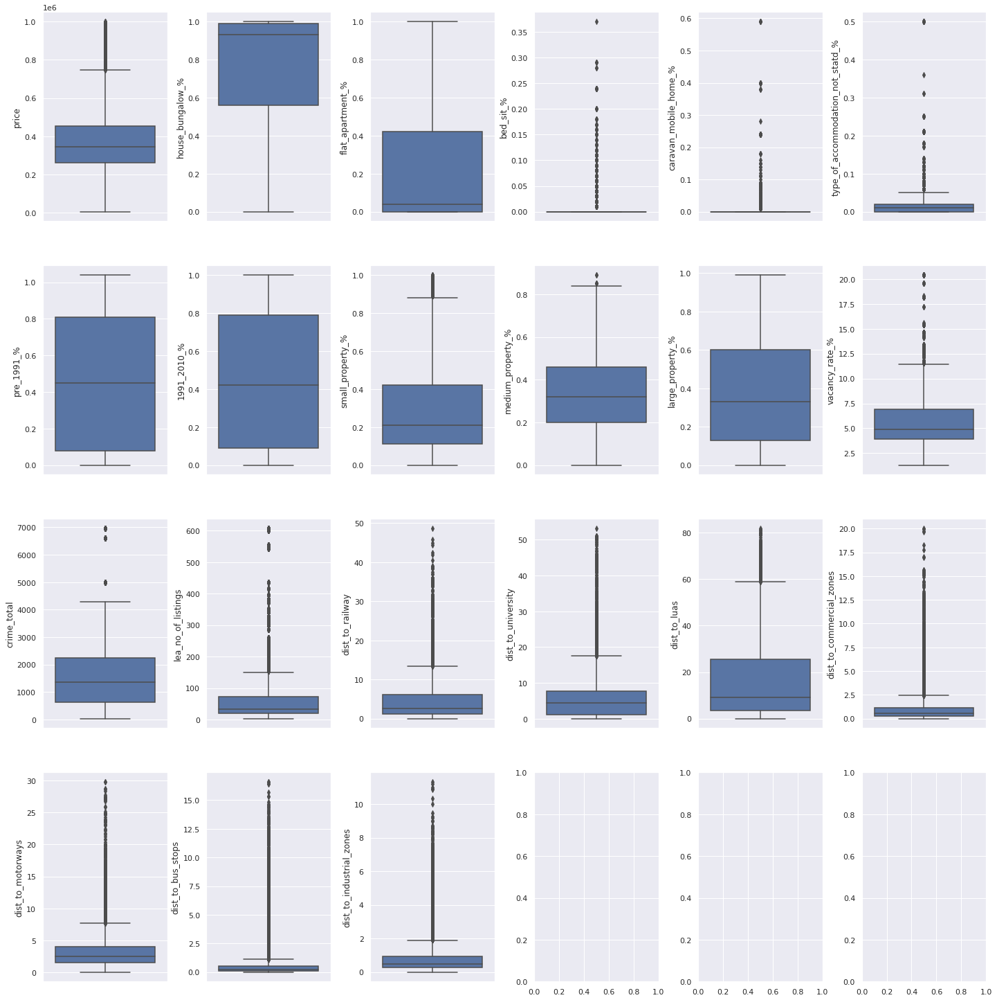

In [77]:
fig, axs = plt.subplots(ncols=6, nrows=4, figsize=(20, 20))
index = 0
axs = axs.flatten()
for k,v in LEA_ppr_percent[['price', 
                  #'month_year', 'latitude', 'longitude', 'geometry', 'lea',
                  'house_bungalow_%', 'flat_apartment_%', 'bed_sit_%', 'caravan_mobile_home_%', 'type_of_accommodation_not_statd_%', 

                  #  'pre_1919_%', '1919_1945_%', '1946_1960_%', '1961_1970_%', '1971_1980_%', '1981_1990_%', '1991_2000_%','2001_2010_%', '2011_or_later_%', 'year_built_not_stated_%', 

                  #  '1_room_%','2_rooms_%', '3_rooms_%', '4_rooms_%', '5_rooms_%', '6_rooms_%', '7_rooms_%', '8_or_more_rooms_%', 'number_of_rooms_not_stated_%',
                  'pre_1991_%', '1991_2010_%',  #'2011_or_later_%',

                  'small_property_%', 'medium_property_%', 'large_property_%',
                  'vacancy_rate_%',

                  'crime_total', 

                  #  'range_lea_no_of_listings', 
                  'lea_no_of_listings',
                  'dist_to_railway', 'dist_to_university', 'dist_to_luas',
                  'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
                  'dist_to_industrial_zones']].items():
    sns.boxplot(y=v, ax=axs[index])
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)


### *Histogram*

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f748cdaab90>,
      dtype=object)

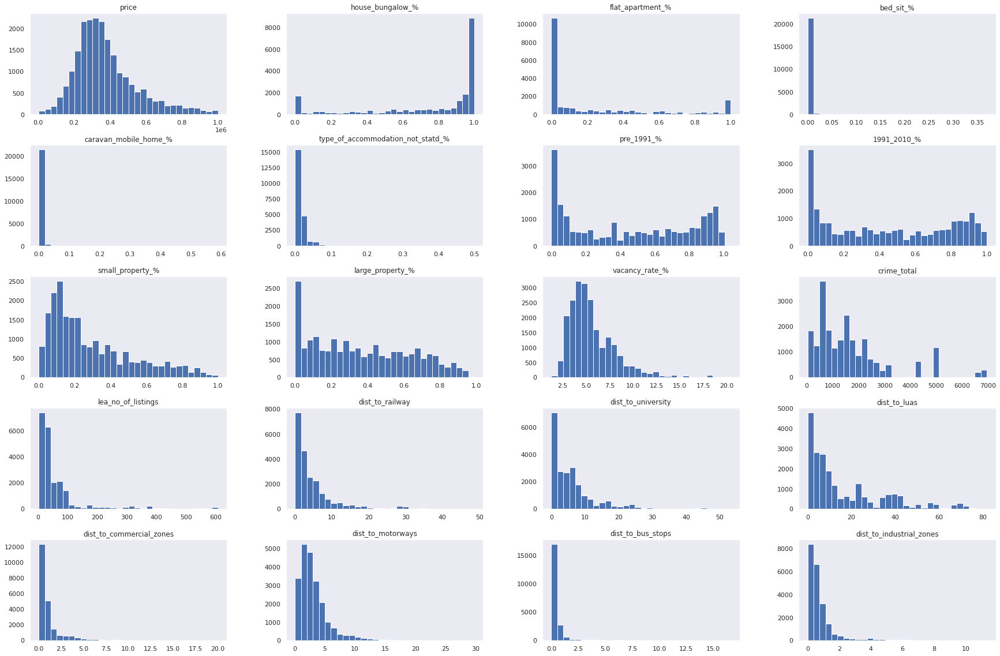

In [78]:
LEA_ppr_percent[['price', 
                  #'month_year', 'latitude', 'longitude', 'geometry', 'lea',
                  'house_bungalow_%', 'flat_apartment_%', 'bed_sit_%', 'caravan_mobile_home_%', 'type_of_accommodation_not_statd_%', 

                  #  'pre_1919_%', '1919_1945_%', '1946_1960_%', '1961_1970_%', '1971_1980_%', '1981_1990_%', '1991_2000_%','2001_2010_%', '2011_or_later_%', 'year_built_not_stated_%', 

                  #  '1_room_%','2_rooms_%', '3_rooms_%', '4_rooms_%', '5_rooms_%', '6_rooms_%', '7_rooms_%', '8_or_more_rooms_%', 'number_of_rooms_not_stated_%',
                  'pre_1991_%', '1991_2010_%',  #'2011_or_later_%',

                  'small_property_%', #'medium_property_%', 
                 'large_property_%',
                  'vacancy_rate_%',

                  'crime_total', 

                  #  'range_lea_no_of_listings', 
                  'lea_no_of_listings',
                  'dist_to_railway', 'dist_to_university', 'dist_to_luas',
                  'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
                  'dist_to_industrial_zones']].hist(grid=False, figsize=(30, 20), bins=30)

### *Observations*

## Price

In [79]:
LEA_ppr_percent.shape

(22135, 48)

### *Skewness and Kutosis* bold text

In [80]:
# review skewness and kurtosis
ppr['price'].agg(['skew', 'kurtosis']).transpose()

skew       1.05378
kurtosis   1.15787
Name: price, dtype: float64

### *Histogram*

In [81]:
fig = px.histogram(ppr, x="price", title = 'Histogram of Price')
fig.update_layout( xaxis_title="Price", yaxis_title="# of Properties")
fig.show()

### *Z-Scores*

In [82]:
ppr['price_SD'] = np.abs(stats.zscore(ppr['price']))
threshold = 3
print(np.where(ppr['price_SD'] > 3))

(array([  233,   376,   468,   581,   711,   760,   788,   792,   822,
         827,   828,   851,   854,   888,   891,   900,   909,   916,
         997,  1058,  1079,  1091,  1120,  1125,  1127,  1148,  1198,
        1202,  1208,  1210,  1218,  1230,  2055,  2132,  2162,  2174,
        2176,  2253,  2264,  2270,  2387,  2401,  2413,  2416,  2419,
        2445,  2453,  2493,  2504,  2505,  2519,  2528,  2547,  2618,
        2656,  2668,  2674,  2680,  2701,  2744,  2747,  2755,  2780,
        2801,  2815,  2825,  2835,  2836,  2838,  2841,  2862,  2966,
        2968,  2988,  2990,  3092,  3103,  3126,  3165,  3233,  3350,
        3363,  3547,  3614,  3683,  3691,  3693,  3931,  3994,  5463,
        6423,  6750,  6823,  6936,  6960,  6986,  7004,  7125,  7235,
        8111,  8494,  8607,  8610,  8651,  8682,  8886,  8926,  9189,
        9410,  9863, 10153, 10340, 10360, 10539, 10570, 10589, 10665,
       10828, 10856, 10861, 11074, 11284, 11770, 12276, 12303, 12316,
       12356, 12642

In [83]:
ppr[ppr['price_SD'] >3].shape

(273, 72)

In [84]:
ppr[ppr['price_SD'] <=3].shape

(21862, 72)

In [85]:
ppr['price'][ppr['price_SD'] <=3].describe()

count    21862.00000
mean    371114.38625
std     163476.51938
min       5300.00000
25%     260000.00000
50%     340000.00000
75%     450000.00000
max     901650.00000
Name: price, dtype: float64

In [86]:
# ED_ppr_normal['price_SD'] = np.abs(stats.zscore(ppr['price']))
# LEA_ppr_normal['price_SD'] = np.abs(stats.zscore(ppr['price']))
# ED_ppr_percent['price_SD'] = np.abs(stats.zscore(ppr['price']))
# LEA_ppr_percent['price_SD'] = np.abs(stats.zscore(ppr['price']))

In [87]:
# ED_ppr_normal = ED_ppr_normal[ED_ppr_normal['price_SD'] <= 3]
# LEA_ppr_normal = LEA_ppr_normal[LEA_ppr_normal['price_SD'] <= 3]
# ED_ppr_percent = ED_ppr_percent[ED_ppr_percent['price_SD'] <= 3]
# LEA_ppr_percent = LEA_ppr_percent[LEA_ppr_percent['price_SD'] <= 3]

### *Boxplot*

In [88]:
fig = px.box(ppr, x="price", title = 'Boxplot of PPR Price')
fig.show()

### *IQR*

In [89]:
Q1 = ppr['price'].quantile(0.25)
Q3 = ppr['price'].quantile(0.75)
IQR = Q3 - Q1
print('IQ1 is {}'.format(Q1))
print('IQ3 is {}'.format(Q3))
print('IQR is {}'.format(IQR))

IQ1 is 260015.9
IQ3 is 455000.0
IQR is 194984.1


In [90]:
ppr['price'].describe()

count    22135.00000
mean    378243.50952
std     174570.19234
min       5300.00000
25%     260015.90000
50%     343000.00000
75%     455000.00000
max     999940.00000
Name: price, dtype: float64

In [91]:
# how many are in IQR RANGE
ppr[~((ppr['price'] < (Q1 - 1.5 * IQR)) |(ppr['price'] > (Q3 + 1.5 * IQR)))].shape

(21026, 72)

In [92]:
# description of prce when in IQR range
ppr['price'][~((ppr['price'] < (Q1 - 1.5 * IQR)) |(ppr['price'] > (Q3 + 1.5 * IQR)))].describe()

count    21026.00000
mean    353371.63949
std     139539.75597
min       5300.00000
25%     258000.00000
50%     335000.00000
75%     430000.00000
max     746666.00000
Name: price, dtype: float64

In [93]:
# how many are outside IQR RANGE
ppr[(ppr['price'] < (Q1 - 1.5 * IQR)) |(ppr['price'] > (Q3 + 1.5 * IQR))].shape

(1109, 72)

### *Dropping Outliers from Price*

In [94]:
ED_ppr_normal = ED_ppr_normal[~((ED_ppr_normal['price'] < (Q1 - 1.5 * IQR)) |(ED_ppr_normal['price'] > (Q3 + 1.5 * IQR)))]
LEA_ppr_normal = LEA_ppr_normal[~((LEA_ppr_normal['price'] < (Q1 - 1.5 * IQR)) |(LEA_ppr_normal['price'] > (Q3 + 1.5 * IQR)))]
ED_ppr_percent = ED_ppr_percent[~((ED_ppr_percent['price'] < (Q1 - 1.5 * IQR)) |(ED_ppr_percent['price'] > (Q3 + 1.5 * IQR)))]
LEA_ppr_percent = LEA_ppr_percent[~((LEA_ppr_percent['price'] < (Q1 - 1.5 * IQR)) |(LEA_ppr_percent['price'] > (Q3 + 1.5 * IQR)))]


In [95]:
LEA_ppr_percent['price'].describe()

count    21026.00000
mean    353371.63949
std     139539.75597
min       5300.00000
25%     258000.00000
50%     335000.00000
75%     430000.00000
max     746666.00000
Name: price, dtype: float64

### *Histogram*

In [96]:
fig = px.histogram(LEA_ppr_percent, x="price", title = 'Histogram of Price')
fig.update_layout( xaxis_title="Price", yaxis_title="# of Properties")
fig.show()

# Model Building

In [97]:
LEA_ppr_percent.shape

(21026, 48)

In [98]:
ED_ppr_percent.shape

(21026, 48)

In [99]:
LEA_ppr_normal.shape

(21026, 48)

In [100]:
ED_ppr_normal.shape

(21026, 48)

## ED Percent

### *Log Data*

In [188]:
DUBLIN_ED_ppr_percent = ED_ppr_percent[ED_ppr_percent['electoral_divisions'].str.contains( 'DUBLIN')]
DUBLIN_ED_ppr_percent.shape

(12932, 48)

In [196]:

# log_ED_ppr_percent = DUBLIN_ED_ppr_percent.copy()
log_ED_ppr_percent = ED_ppr_percent.copy()

log_ED_ppr_percent = log_ED_ppr_percent[['price', 
                  # 'month_year',
                  # 'latitude', 'longitude', 
                  # 'geometry', 
                  # 'electoral_divisions',
                  # 'county',

#### Type of Accommodation
      #  'house_bungalow_%', 'flat_apartment_%',  'bed_sit_%','caravan_mobile_home_%', 'type_of_accommodation_not_statd_%',
#### Year BuilT
      #  'pre_1919_%', '1919_1945_%', '1946_1960_%', '1961_1970_%', '1971_1980_%', '1981_1990_%', '1991_2000_%', '2001_2010_%', '2011_or_later_%', 'year_built_not_stated_%',
#### Property Size       
      #  '1_room_%', '2_rooms_%','3_rooms_%', '4_rooms_%', '5_rooms_%', '6_rooms_%', '7_rooms_%','8_or_more_rooms_%', 'number_of_rooms_not_stated_%', 


#### Type of Accommodation REDUCED
      #  'house_bungalow_%', 'flat_apartment_%', 'other_accomodation_%', 
#### Year Built REDUCED
       'pre_1991_%', '1991_2010_%',
       
       #'2011_or_later_%', 
#### Property Size REDUCED
       'small_property_%', #'medium_property_%',
        'large_property_%',
 

       'vacancy_rate_%',

       'crime_total', 
       
      #  'range_ed_no_of_listings', 
       'ed_no_of_listings',

       'dist_to_railway', 'dist_to_university', 'dist_to_luas',
       'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
       'dist_to_industrial_zones']]

In [197]:
log_ED_ppr_percent['price'] = np.log( log_ED_ppr_percent['price'] + 0.0000000001 )
# 
# log_ED_ppr_percent['house_bungalow_%'] = np.log( log_ED_ppr_percent['house_bungalow_%'] + 0.0000000001 )
# log_ED_ppr_percent['flat_apartment_%'] = np.log( log_ED_ppr_percent['flat_apartment_%'] + 0.0000000001 )
# log_ED_ppr_percent['other_accomodation_%'] = np.log( log_ED_ppr_percent['other_accomodation_%'] + 0.0000000001 )

log_ED_ppr_percent['pre_1991_%'] = np.log( log_ED_ppr_percent['pre_1991_%'] + 0.0000000001 )
log_ED_ppr_percent['1991_2010_%'] = np.log( log_ED_ppr_percent['1991_2010_%'] + 0.0000000001 )
# log_ED_ppr_percent['2011_or_later_%'] = np.log( log_ED_ppr_percent['2011_or_later_%'] + 0.0000000001 )

log_ED_ppr_percent['small_property_%'] = np.log( log_ED_ppr_percent['small_property_%'] + 0.0000000001 )
# log_ED_ppr_percent['medium_property_%'] = np.log( log_ED_ppr_percent['medium_property_%']+ 0.0000000001  )
log_ED_ppr_percent['large_property_%'] = np.log( log_ED_ppr_percent['large_property_%'] + 0.0000000001 )

log_ED_ppr_percent['vacancy_rate_%'] = np.log( log_ED_ppr_percent['vacancy_rate_%'] + 0.0000000001 )
log_ED_ppr_percent['crime_total'] = np.log( log_ED_ppr_percent['crime_total'] + 0.0000000001 )
log_ED_ppr_percent['ed_no_of_listings'] = np.log( log_ED_ppr_percent['ed_no_of_listings']+ 0.0000000001  )


log_ED_ppr_percent['dist_to_railway'] = np.log( log_ED_ppr_percent['dist_to_railway']+ 0.0000000001  )
log_ED_ppr_percent['dist_to_university'] = np.log( log_ED_ppr_percent['dist_to_university']+ 0.0000000001  )
log_ED_ppr_percent['dist_to_luas'] = np.log( log_ED_ppr_percent['dist_to_luas']+ 0.0000000001  )
log_ED_ppr_percent['dist_to_commercial_zones'] = np.log( log_ED_ppr_percent['dist_to_commercial_zones']+ 0.0000000001  )
log_ED_ppr_percent['dist_to_motorways'] = np.log( log_ED_ppr_percent['dist_to_motorways']+ 0.0000000001  )
log_ED_ppr_percent['dist_to_bus_stops'] = np.log( log_ED_ppr_percent['dist_to_bus_stops']+ 0.0000000001  )
log_ED_ppr_percent['dist_to_industrial_zones'] = np.log( log_ED_ppr_percent['dist_to_industrial_zones']+ 0.0000000001  )


In [198]:
# CATEGORICAL VARIABLES
# creating dummies for the dataset
log_ED_ppr_percent = log_ED_ppr_percent.reset_index()
CAT_log_ED_ppr_percent = pd.get_dummies(ED_ppr_percent[['electoral_divisions',
                                                        'month_year']], drop_first=True)
CAT_log_ED_ppr_percent = CAT_log_ED_ppr_percent.reset_index()


log_ED_ppr_percent = pd.merge(log_ED_ppr_percent , CAT_log_ED_ppr_percent, on = 'index', how = 'outer')

# dropping irrelenvant colunns
log_ED_ppr_percent = log_ED_ppr_percent.drop(['index'], axis=1)


log_ED_ppr_percent.head(1).transpose()

,0
price,10.59663
pre_1991_%,-0.05129
1991_2010_%,-2.81341
small_property_%,-0.35667
large_property_%,-3.50656
vacancy_rate_%,2.11626
crime_total,7.83795
ed_no_of_listings,1.09861
dist_to_railway,0.24285
dist_to_university,0.02559


In [ ]:

# checking for missing data
print('Nan in each columns' , log_ED_ppr_percent.isna().sum(), sep='\n')

In [ ]:
log_ED_ppr_percent.columns

In [199]:
vif_LED_ppr_percent_X = log_ED_ppr_percent[[ #'price'
                                                                          
        'pre_1991_%', '1991_2010_%', # '2011_or_later_%',
       'small_property_%', #'medium_property_%', 
       'large_property_%',

       'vacancy_rate_%', 
       
       'crime_total', 
       'ed_no_of_listings', 
       
       'dist_to_railway',
       'dist_to_university',
        'dist_to_luas', 
        'dist_to_commercial_zones',
       'dist_to_motorways', 
       'dist_to_bus_stops', 
       'dist_to_industrial_zones']].astype(float)
vif_ED_ppr_percent_y = log_ED_ppr_percent["price"].astype(int)
vif_LED_ppr_percent_X = sm.add_constant(vif_LED_ppr_percent_X)


# Run VIF for all variable in original dataframe
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(vif_LED_ppr_percent_X.values, i) for i in range(vif_LED_ppr_percent_X.shape[1])]
vif["features"] = vif_LED_ppr_percent_X.columns
vif.round(1)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



,VIF Factor,features
0,157.80000,const
1,1.10000,pre_1991_%
2,1.20000,1991_2010_%
3,1.30000,small_property_%
4,1.30000,large_property_%
5,1.40000,vacancy_rate_%
6,1.70000,crime_total
7,1.00000,ed_no_of_listings
8,1.50000,dist_to_railway
9,2.10000,dist_to_university


In [203]:
log_ED_ppr_percent_X = log_ED_ppr_percent.drop(['price'], axis =1)
log_ED_ppr_percent_X = sm.add_constant(log_ED_ppr_percent_X)

log_ED_ppr_percent_y = log_ED_ppr_percent["price"].astype(int)
# log_ED_ppr_percent_y = pd.DataFrame(log_ED_ppr_percent_y, columns = ['price'])

print(log_ED_ppr_percent_X.shape)
print(log_ED_ppr_percent_y.shape)

(21026, 623)
(21026,)


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



### *Linear Regression*

In [204]:
pd.set_option('display.float_format', lambda x: '%.5f' % x)

# adding the constant term
log_ED_ppr_percent_X = sm.add_constant(log_ED_ppr_percent_X)
 
# running OLS
log_model = sm.OLS(log_ED_ppr_percent_y, log_ED_ppr_percent_X)
log_results = log_model.fit()
log_results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.323
Model:                            OLS   Adj. R-squared:                  0.302
Method:                 Least Squares   F-statistic:                     15.62
Date:                Wed, 10 Aug 2022   Prob (F-statistic):               0.00
Time:                        11:19:29   Log-Likelihood:                -13127.
No. Observations:               21026   AIC:                         2.750e+04
Df Residuals:                   20403   BIC:                         3.245e+04
Df Model:                         622                                         
Covariance Type:            nonrobust                                         
==================================================================================================================================
                                                                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------
const                                                             11.7034      0.243     48.158      0.000      11.227      12.180
pre_1991_%                                                         0.0015      0.001      1.887      0.059   -5.76e-05       0.003
1991_2010_%                                                       -0.0006      0.001     -0.742      0.458      -0.002       0.001
small_property_%                                                  -0.0810      0.004    -20.714      0.000      -0.089      -0.073
large_property_%                                                   0.0066      0.001      7.875      0.000       0.005       0.008
vacancy_rate_%                                                     0.2677      0.128      2.090      0.037       0.017       0.519
crime_total                                                       -0.0061      0.017     -0.370      0.711      -0.039       0.026
ed_no_of_listings                                                  0.0002      0.001      0.241      0.810      -0.002       0.002
dist_to_railway                                                   -0.0304      0.010     -3.032      0.002      -0.050      -0.011
dist_to_university                                                 0.0658      0.012      5.648      0.000       0.043       0.089
dist_to_luas                                                      -0.0321      0.018     -1.777      0.076      -0.068       0.003
dist_to_commercial_zones                                           0.0084      0.005      1.585      0.113      -0.002       0.019
dist_to_motorways                                                 -0.0015      0.009     -0.158      0.874      -0.019       0.017
dist_to_bus_stops                                                  0.0334      0.005      7.016      0.000       0.024       0.043
dist_to_industrial_zones                                           0.0103      0.006      1.816      0.069      -0.001       0.021
electoral_divisions_ALTIDORE, CO.WICKLOW                           0.6703      0.335      2.002      0.045       0.014       1.327
electoral_divisions_ARDAGH, CO.MEATH                              -0.6224      0.494     -1.261      0.207      -1.590       0.345
electoral_divisions_ARDBRACCAN, CO.MEATH                          -0.1236      0.200     -0.617      0.537      -0.516       0.269
electoral_divisions_ARDCATH, CO.MEATH                             -0.0911      0.197     -0.462      0.644      -0.478       0.296
electoral_divisions_ARDEE RURAL, CO.LOUTH                         -0.4965      0.164     -3.028      0.002      -0.818      -0.175
electoral_divisions_ARDEE URBAN, CO.LOUTH                         -0.5

### *Training and Test Split*

In [205]:
# TRAINING AND TEST SET
# Dividing dataset into training and test sets
log_ED_ppr_percent_X_train, log_ED_ppr_percent_X_test, log_ED_ppr_percent_y_train, log_ED_ppr_percent_y_test = train_test_split( log_ED_ppr_percent_X, log_ED_ppr_percent_y, test_size = 0.3, random_state = 100)

print(log_ED_ppr_percent_X_train.shape)
print(log_ED_ppr_percent_y_test.shape)

(14718, 623)
(6308,)


### *Decision Tree*

In [ ]:
# Building Classification Decision Tree Model
dtree = tree.DecisionTreeClassifier(criterion = 'entropy', max_depth = 5)
dtree.fit(log_ED_ppr_percent_X_train, log_ED_ppr_percent_y_train)
Y_pred = dtree.predict(log_ED_ppr_percent_X_test)
metrics.r2_score(log_ED_ppr_percent_y_test, Y_pred)



In [ ]:
featimp = pd.Series(dtree.feature_importances_, index=list(log_ED_ppr_percent_X_test)).sort_values(ascending=False)
print(featimp)

In [ ]:
# Creating a plot to visualise the feature importance
sns.set()
fig, ax = plt.subplots(figsize=(12,12))
featimp[:20].plot(kind='barh')
plt.title("Decisison Tree Feature Importance", fontsize = 18)
plt.show()

In [ ]:
plt.scatter(log_ED_ppr_percent_y_test, Y_pred)

In [ ]:
plt.hist(log_ED_ppr_percent_y_test- Y_pred)

### *Random Forest*

In [206]:
# Building random forest model

rfc = RandomForestClassifier(n_estimators=300, criterion='entropy', max_features='auto')
rfc.fit(log_ED_ppr_percent_X_train, log_ED_ppr_percent_y_train)
Y_pred = rfc.predict(log_ED_ppr_percent_X_test)
metrics.r2_score(log_ED_ppr_percent_y_test, Y_pred)

0.1668889580565276

In [ ]:
featimp = pd.Series(rfc.feature_importances_, index=list(log_ED_ppr_percent_X_test)).sort_values(ascending=False)
print(featimp)

In [ ]:
# Creating a plot to visualise the feature importance
sns.set()
fig, ax = plt.subplots(figsize=(12,12))
featimp[:20].plot(kind='barh')
plt.title("Decisison Tree Feature Importance", fontsize = 18)
plt.show()

In [ ]:
plt.scatter(log_aED_ppr_percent_y_test, Y_pred)

### *Geographically Weighted Linear Regression*

In [ ]:
# ED_gdf = gpd.read_file('/content/drive/My Drive/c00278440_Karina_Jonina_MSc_Data_Science_Dissertation/Data/clean_electoral_division_gdf.geojson')

# LEA_gdf = gpd.read_file('/content/drive/My Drive/c00278440_Karina_Jonina_MSc_Data_Science_Dissertation/Data/clean_LEA.geojson')

In [ ]:
# ED_gdf = gpd.read_file('Data/Shapefiles/clean_electoral_division_gdf.geojson')

# LEA_gdf = gpd.read_file('Data/Shapefiles/clean_LEA.geojson')

In [ ]:
# ED_gdf.plot()

In [ ]:
# fig, ax = plt.subplots(figsize=(25,25))
# ED_gdf.plot(ax=ax, **{'edgecolor':'black', 'facecolor':'white'})
# ED_gdf.centroid.plot(ax=ax, c='blue')

In [ ]:
# # saving csv in the csv
# log_ED_ppr_percent.to_csv('/content/drive/My Drive/Dissertation/Data/log_ED_ppr_percent.csv')

# log_ED_ppr_percent_2=  ps.examples.get_path('https://drive.google.com/file/d/1nzZs1b7md7G9PSToluxCwb-WgyvjNdcV/view?usp=sharing')

In [ ]:
# print(log_ED_ppr_percent_2)

In [ ]:
# #Prepare dataset inputs

# u = ED_ppr_percent['longitude']
# v = ED_ppr_percent['latitude']
# coords = list(zip(u,v))

# y = np.array(log_ED_ppr_percent_2.by_col('price')).reshape((-1,1))

# small_property_ = np.array(log_ED_ppr_percent_2.by_col('small_property_%')).reshape((-1,1))
# medium_property_ = np.array(log_ED_ppr_percent_2.by_col('medium_property_%')).reshape((-1,1))
# large_property_ = np.array(log_ED_ppr_percent_2.by_col('large_property_%')).reshape((-1,1))
# vacancy_rate_ = np.array(log_ED_ppr_percent_2.by_col('vacancy_rate_%')).reshape((-1,1))
# crime_total = np.array(log_ED_ppr_percent_2.by_col('crime_total')).reshape((-1,1))
# ed_no_of_listings = np.array(log_ED_ppr_percent_2.by_col('ed_no_of_listings')).reshape((-1,1))

# dist_to_railway = np.array(log_ED_ppr_percent_2.by_col('dist_to_railway')).reshape((-1,1))
# dist_to_university = np.array(log_ED_ppr_percent_2.by_col('dist_to_university')).reshape((-1,1))
# dist_to_luas = np.array(log_ED_ppr_percent_2.by_col('dist_to_luas')).reshape((-1,1))
# dist_to_commercial_zones = np.array(log_ED_ppr_percent_2.by_col('dist_to_commercial_zones')).reshape((-1,1))
# dist_to_motorways = np.array(log_ED_ppr_percent_2.by_col('dist_to_motorways')).reshape((-1,1))
# dist_to_bus_stops = np.array(log_ED_ppr_percent_2.by_col('dist_to_bus_stops')).reshape((-1,1))
# dist_to_industrial_zones = np.array(log_ED_ppr_percent_2.by_col('dist_to_industrial_zones')).reshape((-1,1))
# dist_to_motorways = np.array(log_ED_ppr_percent_2.by_col('dist_to_motorways')).reshape((-1,1))


# X = np.hstack([small_property_, 
#                medium_property_, 
#                large_property_, 
#                vacancy_rate_,
#                crime_total,
#                ed_no_of_listings,
#                dist_to_railway,
#               dist_to_university,
#               dist_to_luas,
#               dist_to_commercial_zones,
#               dist_to_bus_stops,
#               dist_to_industrial_zones])

# X = (X - X.mean(axis=0)) / X.std(axis=0)
# y = (y - y.mean(axis=0)) / y.std(axis=0)
# selector = Sel_BW(coords, y, X, multi=True)
# selector.search(multi_bw_min=[2])


# #Calibrate MGWR model
# model = MGWR(coords, y, X, selector, fixed=False, kernel='bisquare', sigma2_v1=True)
# results = model.fit()
# print(results.params.shape)

In [ ]:
# log_ED_ppr_percent_X.columns

In [ ]:
# #Prepare dataset inputs

# u = ED_ppr_percent['longitude']
# v = ED_ppr_percent['latitude']
# coords = list(zip(u,v))

# y = np.array(log_ED_ppr_percent_y['price']).reshape((-1,1))

# small_property_ = np.array(log_ED_ppr_percent_X['small_property_%']).reshape((-1,1))
# # medium_property_ = np.array(log_ED_ppr_percent_X['medium_property_%']).reshape((-1,1))
# large_property_ = np.array(log_ED_ppr_percent_X['large_property_%']).reshape((-1,1))
# vacancy_rate_ = np.array(log_ED_ppr_percent_X['vacancy_rate_%']).reshape((-1,1))
# crime_total = np.array(log_ED_ppr_percent_X['crime_total']).reshape((-1,1))
# ed_no_of_listings = np.array(log_ED_ppr_percent_X['ed_no_of_listings']).reshape((-1,1))

# dist_to_railway = np.array(log_ED_ppr_percent_X['dist_to_railway']).reshape((-1,1))
# dist_to_university = np.array(log_ED_ppr_percent_X['dist_to_university']).reshape((-1,1))
# dist_to_luas = np.array(log_ED_ppr_percent_X['dist_to_luas']).reshape((-1,1))
# dist_to_commercial_zones = np.array(log_ED_ppr_percent_X['dist_to_commercial_zones']).reshape((-1,1))
# dist_to_motorways = np.array(log_ED_ppr_percent_X['dist_to_motorways']).reshape((-1,1))
# dist_to_bus_stops = np.array(log_ED_ppr_percent_X['dist_to_bus_stops']).reshape((-1,1))
# dist_to_industrial_zones = np.array(log_ED_ppr_percent_X['dist_to_industrial_zones']).reshape((-1,1))
# dist_to_motorways = np.array(log_ED_ppr_percent_X['dist_to_motorways']).reshape((-1,1))


# X = np.hstack([small_property_, 
#               #  medi/um_property_, 
#                large_property_, 
#                vacancy_rate_,
#                crime_total,
#                ed_no_of_listings,
#                dist_to_railway,
#               dist_to_university,
#               dist_to_luas,
#               dist_to_commercial_zones,
#               dist_to_bus_stops,
#               dist_to_industrial_zones])

# X = (X - X.mean(axis=0)) / X.std(axis=0)
# y = (y - y.mean(axis=0)) / y.std(axis=0)
# selector = Sel_BW(coords, y, X, multi=True)
# selector.search(multi_bw_min=[2])


# #Calibrate MGWR model
# model = MGWR(coords, y, X, selector, fixed=False, kernel='bisquare', sigma2_v1=True)
# results = model.fit()
# print(results.params.shape)

In [ ]:
# data = ps.io.open(ps.examples.get_path('GData_utm.csv'))
# type(data)
# coords = list(zip(data.by_col('X'), data.by_col('Y')))
# y = np.array(data.by_col('PctBach')).reshape((-1,1))
# rural = np.array(data.by_col('PctRural')).reshape((-1,1))
# fb = np.array(data.by_col('PctFB')).reshape((-1,1))
# african_amer = np.array(data.by_col('PctBlack')).reshape((-1,1))
# X = np.hstack([fb, african_amer, rural])
# X = (X - X.mean(axis=0)) / X.std(axis=0)
# y = (y - y.mean(axis=0)) / y.std(axis=0)
# selector = Sel_BW(coords, y, X, multi=True)
# selector.search(multi_bw_min=[2])

# model = MGWR(coords, y, X, selector, fixed=False, kernel='bisquare', sigma2_v1=True)
# results = model.fit()
# print(results.params.shape)

## ED Normal

### *Log Data*

In [ ]:
DUBLIN_ED_ppr_normal = ED_ppr_normal[ED_ppr_normal['electoral_divisions'].str.contains( 'DUBLIN')]
DUBLIN_ED_ppr_normal.shape

In [ ]:
# log_ED_ppr_normal = DUBLIN_ED_ppr_normal.copy

log_ED_ppr_normal = ED_ppr_normal.copy() 
log_ED_ppr_normal = log_ED_ppr_normal[[ #'month_year', 'latitude', 'longitude', 'geometry','electoral_divisions',
                                       'price',
                                                                          
                                        # 'house_bungalow', 'flat_apartment', 'other_accomodation',
                                     
                                        'pre_1991', '1991_2010', '2011_or_later',
                                     
                                        'small_property', 
                                    #  'medium_property', 
                                     'large_property',

                                        'vacant_dwellings',
                                        'crime_total',

                                        # 'range_ed_no_of_listings', 
                                        'ed_no_of_listings',

                                        'dist_to_railway', 'dist_to_university', 'dist_to_luas',
                                        'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
                                        'dist_to_industrial_zones']].astype(float)


In [ ]:
log_ED_ppr_normal['price'] = np.log( log_ED_ppr_normal['price'] + 0.0000000001 )

# log_ED_ppr_normal['house_bungalow_%'] = np.log( log_ED_ppr_normal['house_bungalow_%'] + 0.0000000001 )
# log_ED_ppr_normal['flat_apartment_%'] = np.log( log_ED_ppr_normal['flat_apartment_%'] + 0.0000000001 )
# log_ED_ppr_normal['other_accomodation_%'] = np.log( log_ED_ppr_normal['other_accomodation_%'] + 0.0000000001 )

log_ED_ppr_normal['pre_1991'] = np.log( log_ED_ppr_normal['pre_1991'] + 0.0000000001 )
log_ED_ppr_normal['1991_2010'] = np.log( log_ED_ppr_normal['1991_2010'] + 0.0000000001 )
# log_ED_ppr_normal['2011_or_later'] = np.log( log_ED_ppr_normal['2011_or_later'] + 0.0000000001 )

log_ED_ppr_normal['small_property'] = np.log( log_ED_ppr_normal['small_property'] + 0.0000000001 )
# log_ED_ppr_normal['medium_property'] = np.log( log_ED_ppr_normal['medium_property']+ 0.0000000001  )
log_ED_ppr_percent['large_property'] = np.log( log_ED_ppr_normal['large_property'] + 0.0000000001 )

log_ED_ppr_normal['vacant_dwellings'] = np.log( log_ED_ppr_normal['vacant_dwellings'] + 0.0000000001 )
log_ED_ppr_normal['crime_total'] = np.log( log_ED_ppr_normal['crime_total'] + 0.0000000001 )
log_ED_ppr_normal['ed_no_of_listings'] = np.log( log_ED_ppr_normal['ed_no_of_listings']+ 0.0000000001  )


log_ED_ppr_normal['dist_to_railway'] = np.log( log_ED_ppr_normal['dist_to_railway']+ 0.0000000001  )
log_ED_ppr_normal['dist_to_university'] = np.log( log_ED_ppr_normal['dist_to_university']+ 0.0000000001  )
log_ED_ppr_normal['dist_to_luas'] = np.log( log_ED_ppr_normal['dist_to_luas']+ 0.0000000001  )
log_ED_ppr_normal['dist_to_commercial_zones'] = np.log( log_ED_ppr_normal['dist_to_commercial_zones']+ 0.0000000001  )
log_ED_ppr_normal['dist_to_motorways'] = np.log( log_ED_ppr_normal['dist_to_motorways']+ 0.0000000001  )
log_ED_ppr_normal['dist_to_bus_stops'] = np.log( log_ED_ppr_normal['dist_to_bus_stops']+ 0.0000000001  )
log_ED_ppr_normal['dist_to_industrial_zones'] = np.log( log_ED_ppr_normal['dist_to_industrial_zones']+ 0.0000000001  )


In [ ]:
log_ED_ppr_normal.head()

In [ ]:
# CATEGORICAL VARIABLES
# creating dummies for the dataset
log_ED_ppr_normal = log_ED_ppr_normal.reset_index()
CAT_log_ED_ppr_normal = pd.get_dummies(ED_ppr_normal[['electoral_divisions',
                                                        'month_year']], drop_first=True)

CAT_log_ED_ppr_normal = pd.get_dummies(DUBLIN_ED_ppr_normal[['electoral_divisions',
                                                        'month_year']], drop_first=True)


CAT_log_ED_ppr_normal = CAT_log_ED_ppr_normal.reset_index()


log_ED_ppr_normal = pd.merge(log_ED_ppr_normal , CAT_log_ED_ppr_normal, on = 'index', how = 'outer')

# dropping irrelenvant colunns
log_ED_ppr_normal = log_ED_ppr_normal.drop(['index'], axis=1)


log_ED_ppr_normal.head(1).transpose()

### *Linear Regression*

In [ ]:
log_ED_ppr_normal_X = log_ED_ppr_normal.drop(['price'], axis =1)
log_ED_ppr_normal_X = sm.add_constant(log_ED_ppr_normal_X)

log_ED_ppr_normal_y = log_ED_ppr_normal["price"].astype(int)
log_ED_ppr_normal = pd.DataFrame(log_ED_ppr_normal, columns = ['price'])

print(log_ED_ppr_normal_X.shape)
print(log_ED_ppr_normal_y.shape)

In [ ]:
# adding the constant term
log_ED_ppr_normal_X = sm.add_constant(log_ED_ppr_normal_X)
 
# running OLS
log_model = sm.OLS(log_ED_ppr_normal_y, log_ED_ppr_normal_X)
log_results = log_model.fit()
log_results.summary()

### *Training and Test Set*

In [ ]:
# TRAINING AND TEST SET
# Dividing dataset into training and test sets
log_ED_ppr_normal_X_train, log_ED_ppr_normal_X_test, log_ED_ppr_normal_y_train, log_ED_ppr_normal_y_test = train_test_split( log_ED_ppr_normal_X, log_ED_ppr_normal_y, test_size = 0.3, random_state = 100)

print(log_ED_ppr_normal_X_train.shape)
print(log_ED_ppr_normal_y_test.shape)

### *Decision Tree*

In [ ]:
# Building Classification Decision Tree Model
dtree = tree.DecisionTreeClassifier(criterion = 'entropy', max_depth = 5)
dtree.fit(log_ED_ppr_normal_X_train, log_ED_ppr_normal_y_train)
Y_pred = dtree.predict(log_ED_ppr_normal_X_test)
metrics.r2_score(log_ED_ppr_normal_y_test, Y_pred)

In [ ]:
featimp = pd.Series(rfc.feature_importances_, index=list(log_ED_ppr_normal_X_test)).sort_values(ascending=False)
print(featimp)

In [ ]:
plt.scatter(log_ED_ppr_normal_y_test, Y_pred)

In [ ]:
plt.hist(log_ED_ppr_normal_y_test- Y_pred)

### *Random Forest*

In [ ]:
rfc = RandomForestClassifier(n_estimators=300, criterion='entropy', max_features='auto')
rfc.fit(log_ED_ppr_normal_X_train, log_ED_ppr_normal_y_train)
Y_pred = rfc.predict(log_ED_ppr_normal_X_test)
metrics.r2_score(log_ED_ppr_normal_y_test, Y_pred)


In [ ]:
featimp = pd.Series(rfc.feature_importances_, index=list(log_ED_ppr_normal_X_test)).sort_values(ascending=False)
print(featimp)

In [ ]:
# Creating a plot to visualise the feature importance
sns.set()
fig, ax = plt.subplots(figsize=(12,12))
featimp[:20].plot(kind='barh')
plt.title("Decisison Tree Feature Importance", fontsize = 18)
plt.show()



In [ ]:
plt.scatter(log_aED_ppr_percent_y_test, Y_pred)

## LEA Percent

### *Log Data*

In [230]:
DUBLIN_LEA_ppr_percent = LEA_ppr_percent[LEA_ppr_percent['county'].str.contains( 'DUBLIN')]
DUBLIN_LEA_ppr_percent.shape

(12932, 48)

In [231]:
# log_LEA_ppr_percent = DUBLIN_LEA_ppr_percent.copy()
# 
log_LEA_ppr_percent = LEA_ppr_percent.copy()

log_LEA_ppr_percent = log_LEA_ppr_percent[['price', 
                  # 'month_year',
                  # 'latitude', 'longitude', 
                  # 'geometry', 
                  # 'electoral_divisions',
                  # 'county',

#### Type of Accommodation
      #  'house_bungalow_%', 'flat_apartment_%',  'bed_sit_%','caravan_mobile_home_%', 'type_of_accommodation_not_statd_%',
#### Year BuilT
      #  'pre_1919_%', '1919_1945_%', '1946_1960_%', '1961_1970_%', '1971_1980_%', '1981_1990_%', '1991_2000_%', '2001_2010_%', '2011_or_later_%', 'year_built_not_stated_%',
#### Property Size       
      #  '1_room_%', '2_rooms_%','3_rooms_%', '4_rooms_%', '5_rooms_%', '6_rooms_%', '7_rooms_%','8_or_more_rooms_%', 'number_of_rooms_not_stated_%', 


#### Type of Accommodation REDUCED
      #  'house_bungalow_%', 'flat_apartment_%', 'other_accomodation_%', 
#### Year Built REDUCED
       'pre_1991_%', '1991_2010_%',
       
       #'2011_or_later_%', 
#### Property Size REDUCED
       'small_property_%', #'medium_property_%',
        'large_property_%',
 

       'vacancy_rate_%',

       'crime_total', 
       
      #  'range_ed_no_of_listings', 
       'lea_no_of_listings',

       'dist_to_railway', 'dist_to_university', 'dist_to_luas',
       'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
       'dist_to_industrial_zones']]

In [232]:
# print summary information to view data
log_LEA_ppr_percent.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21026 entries, 0 to 22167
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   price                     21026 non-null  float64
 1   pre_1991_%                21026 non-null  float64
 2   1991_2010_%               21026 non-null  float64
 3   small_property_%          21026 non-null  float64
 4   large_property_%          21026 non-null  float64
 5   vacancy_rate_%            21026 non-null  float64
 6   crime_total               21026 non-null  float64
 7   lea_no_of_listings        21026 non-null  float64
 8   dist_to_railway           21026 non-null  float64
 9   dist_to_university        21026 non-null  float64
 10  dist_to_luas              21026 non-null  float64
 11  dist_to_commercial_zones  21026 non-null  float64
 12  dist_to_motorways         21026 non-null  float64
 13  dist_to_bus_stops         21026 non-null  float64
 14  dist_t

In [233]:
log_LEA_ppr_percent['price'] = np.log( log_LEA_ppr_percent['price'] + 0.0000000001 )

# log_LEA_ppr_percent['house_bungalow_%'] = np.log( log_LEA_ppr_percent['house_bungalow_%'] + 0.0000000001 )
# log_LEA_ppr_percent['flat_apartment_%'] = np.log( log_LEA_ppr_percent['flat_apartment_%'] + 0.0000000001 )
# log_LEA_ppr_percent['bed_sit_%'] = np.log( log_LEA_ppr_percent['bed_sit_%'] + 0.0000000001 )
# log_LEA_ppr_percent['caravan_mobile_home_%'] = np.log( log_LEA_ppr_percent['caravan_mobile_home_%'] + 0.0000000001 )
# log_LEA_ppr_percent['type_of_accommodation_not_statd_%'] = np.log( log_LEA_ppr_percent['type_of_accommodation_not_statd_%'] + 0.0000000001 )

log_LEA_ppr_percent['pre_1991_%'] = np.log( log_LEA_ppr_percent['pre_1991_%'] + 0.0000000001 )
log_LEA_ppr_percent['1991_2010_%'] = np.log( log_LEA_ppr_percent['1991_2010_%'] + 0.0000000001 )
# log_LEA_ppr_percent['2011_or_later_%'] = np.log( log_ED_pprllog_LEA_ppr_percentog_LEA_ppr_percent_percent['2011_or_later_%'] + 0.0000000001 )

log_LEA_ppr_percent['small_property_%'] = np.log( log_LEA_ppr_percent['small_property_%'] + 0.0000000001 )
# log_LEA_ppr_percent['medium_property_%'] = np.log( log_LEA_ppr_percent['medium_property_%']+ 0.0000000001  )
log_LEA_ppr_percent['large_property_%'] = np.log( log_LEA_ppr_percent['large_property_%'] + 0.0000000001 )

log_LEA_ppr_percent['vacancy_rate_%'] = np.log( log_LEA_ppr_percent['vacancy_rate_%'] + 0.0000000001 )
log_LEA_ppr_percent['crime_total'] = np.log( log_LEA_ppr_percent['crime_total'] + 0.0000000001 )
log_LEA_ppr_percent['lea_no_of_listings'] = np.log( log_LEA_ppr_percent['lea_no_of_listings']+ 0.0000000001  )


log_LEA_ppr_percent['dist_to_railway'] = np.log( log_LEA_ppr_percent['dist_to_railway']+ 0.0000000001  )
log_LEA_ppr_percent['dist_to_luas'] = np.log( log_LEA_ppr_percent['dist_to_luas']+ 0.0000000001  )
log_LEA_ppr_percent['dist_to_commercial_zones'] = np.log( log_LEA_ppr_percent['dist_to_commercial_zones']+ 0.0000000001  )
log_LEA_ppr_percent['dist_to_motorways'] = np.log( log_LEA_ppr_percent['dist_to_motorways']+ 0.0000000001  )
log_LEA_ppr_percent['dist_to_bus_stops'] = np.log( log_LEA_ppr_percent['dist_to_bus_stops']+ 0.0000000001  )
log_LEA_ppr_percent['dist_to_industrial_zones'] = np.log( log_LEA_ppr_percent['dist_to_industrial_zones']+ 0.0000000001  )
log_LEA_ppr_percent['lea_no_of_listings'] = np.log( log_LEA_ppr_percent['lea_no_of_listings']+ 0.0000000001  )

In [234]:
log_LEA_ppr_percent.shape

(21026, 15)

In [235]:

# checking for missing data
print('Nan in each columns' , log_LEA_ppr_percent.isna().sum(), sep='\n')

Nan in each columns
price                       0
pre_1991_%                  0
1991_2010_%                 0
small_property_%            0
large_property_%            0
vacancy_rate_%              0
crime_total                 0
lea_no_of_listings          0
dist_to_railway             0
dist_to_university          0
dist_to_luas                0
dist_to_commercial_zones    0
dist_to_motorways           0
dist_to_bus_stops           0
dist_to_industrial_zones    0
dtype: int64


In [236]:
# CATEGORICAL VARIABLES
# creating dummies for the dataset
log_LEA_ppr_percent = log_LEA_ppr_percent.reset_index()


# CAT_log_LEA_ppr_percent = pd.get_dummies(DUBLIN_LEA_ppr_percent[['lea',
#                                                         'month_year']], drop_first=True)

CAT_log_LEA_ppr_percent = pd.get_dummies(LEA_ppr_percent[['lea',
                                                        'month_year']], drop_first=True)

CAT_log_LEA_ppr_percent = CAT_log_LEA_ppr_percent.reset_index()


log_LEA_ppr_percent = pd.merge(log_LEA_ppr_percent , CAT_log_LEA_ppr_percent, on = 'index', how = 'outer')

# dropping log_LEA_ppr_percent colunns
log_LEA_ppr_percent = log_LEA_ppr_percent.drop(['index'], axis=1)


log_LEA_ppr_percent.head(1).transpose()

,0
price,10.59663
pre_1991_%,-0.05129
1991_2010_%,-2.81341
small_property_%,-0.35667
large_property_%,-3.50656
vacancy_rate_%,2.11626
crime_total,7.83795
lea_no_of_listings,1.64623
dist_to_railway,0.24285
dist_to_university,1.02592


### *Linear Regression*

In [237]:
# checking for missing data
print('Nan in each columns' , log_LEA_ppr_percent.isna().sum(), sep='\n')

Nan in each columns
price                                0
pre_1991_%                           0
1991_2010_%                          0
small_property_%                     0
large_property_%                     0
vacancy_rate_%                       0
crime_total                          0
lea_no_of_listings                   0
dist_to_railway                      0
dist_to_university                   0
dist_to_luas                         0
dist_to_commercial_zones             0
dist_to_motorways                    0
dist_to_bus_stops                    0
dist_to_industrial_zones             0
lea_ARKLOW LEA                       0
lea_ARTANE-WHITEHALL LEA             0
lea_ASHBOURNE LEA                    0
lea_ATHY LEA                         0
lea_BALBRIGGAN LEA                   0
lea_BALLYFERMOT-DRIMNAGH LEA         0
lea_BALLYMUN-FINGLAS LEA             0
lea_BALTINGLASS LEA                  0
lea_BLACKROCK LEA                    0
lea_BLANCHARDSTOWN-MULHUDDART LEA    0
lea_B

In [238]:
log_LEA_ppr_percent_X = log_LEA_ppr_percent.drop(['price'], axis =1)
log_LEA_ppr_percent_X = sm.add_constant(log_LEA_ppr_percent_X)

log_LEA_ppr_percent_y = log_LEA_ppr_percent["price"].astype(int)

print(log_LEA_ppr_percent_X.shape)
print(log_LEA_ppr_percent_y.shape)

(21026, 81)
(21026,)


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



In [239]:


# =============================================================================
# LOG LINEAR REGRESSION
# =============================================================================

# adding the constant term
log_LEA_ppr_percent_X = sm.add_constant(log_LEA_ppr_percent_X)
 
# running OLS
log_model = sm.OLS(log_LEA_ppr_percent_y, log_LEA_ppr_percent_X)
log_results = log_model.fit()
log_results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.251
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     87.91
Date:                Wed, 10 Aug 2022   Prob (F-statistic):               0.00
Time:                        12:08:57   Log-Likelihood:                -14177.
No. Observations:               21026   AIC:                         2.852e+04
Df Residuals:                   20945   BIC:                         2.916e+04
Df Model:                          80                                         
Covariance Type:            nonrobust                                         
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const                                12.0657      0.102    118.827      0.000      11.867      12.265
pre_1991_%                            0.0009      0.001      1.187      0.235      -0.001       0.002
1991_2010_%                           0.0010      0.001      1.382      0.167      -0.000       0.002
small_property_%                     -0.0960      0.004    -25.960      0.000      -0.103      -0.089
large_property_%                      0.0078      0.001      9.835      0.000       0.006       0.009
vacancy_rate_%                       -0.0034      0.012     -0.284      0.776      -0.027       0.020
crime_total                          -0.0396      0.007     -5.946      0.000      -0.053      -0.027
lea_no_of_listings                   -0.1270      0.060     -2.129      0.033      -0.244      -0.010
dist_to_railway                       0.0168      0.005      3.174      0.002       0.006       0.027
dist_to_university                   -0.0086      0.001     -7.118      0.000      -0.011      -0.006
dist_to_luas                          0.0063      0.009      0.682      0.495      -0.012       0.024
dist_to_commercial_zones              0.0074      0.004      1.818      0.069      -0.001       0.015
dist_to_motorways                     0.0050      0.006      0.879      0.380      -0.006       0.016
dist_to_bus_stops                     0.0176      0.004      4.364      0.000       0.010       0.025
dist_to_industrial_zones              0.0149      0.005      3.260      0.001       0.006       0.024
lea_ARKLOW LEA                        0.3792      0.059      6.409      0.000       0.263       0.495
lea_ARTANE-WHITEHALL LEA              0.4711      0.051      9.287      0.000       0.372       0.571
lea_ASHBOURNE LEA                     0.3970      0.049      8.074      0.000       0.301       0.493
lea_ATHY LEA                         -0.0638      0.049     -1.308      0.191      -0.160       0.032
lea_BALBRIGGAN LEA                    0.4582      0.046      9.885      0.000       0.367       0.549
lea_BALLYFERMOT-DRIMNAGH LEA          0.3598      0.057      6.270      0.000       0.247       0.472
lea_BALLYMUN-FINGLAS LEA              0.4186      0.053      7.859      0.000       0.314       0.523
lea_BALTINGLASS LEA                   0.1357      0.054      2.494      0.013       0.029       0.242
lea_BLACKROCK LEA                     0.8977      0.052     17.423      0.000       0.797       0.999
lea_BLANCHARDSTOWN-MULHUDDART LEA     0.3957      0.049      8.012      0.000       0.299       0.493
lea_BRAY EAST LEA                     0.6061      0.056     10.826      0.000       0.496       0.716
lea_BRAY WEST LEA                     0.5677      0.056     10.078      0.000       0.457       0.678
lea_CABRA-GLASNEVIN LEA

### *Training and Test Set*

In [240]:
log_LEA_ppr_percent_X = log_LEA_ppr_percent.drop(['price'], axis =1)
log_LEA_ppr_percent_y = log_LEA_ppr_percent["price"].astype(int)
log_LEA_ppr_percent_X = sm.add_constant(log_LEA_ppr_percent_X)

print(log_LEA_ppr_percent_X.shape)
print(log_LEA_ppr_percent_y.shape)

(21026, 81)
(21026,)


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



In [241]:
# TRAINING AND TEST SET
# Dividing dataset into training and test sets
log_LEA_ppr_percent_X_train, log_LEA_ppr_percent_X_test, log_LEA_ppr_percent_y_train, log_LEA_ppr_percent_y_test = train_test_split( log_LEA_ppr_percent_X, log_LEA_ppr_percent_y, test_size = 0.3, random_state = 100)

print(log_LEA_ppr_percent_X_train.shape)
print(log_LEA_ppr_percent_y_test.shape)

(14718, 81)
(6308,)


### *Decision Tree*

In [242]:
# Building Classification Decision Tree Model
dtree = tree.DecisionTreeClassifier(criterion = 'entropy', max_depth = 5)
dtree.fit(log_LEA_ppr_percent_X_train, log_LEA_ppr_percent_y_train)
Y_pred = dtree.predict(log_LEA_ppr_percent_X_test)
metrics.r2_score(log_LEA_ppr_percent_y_test, Y_pred)

0.011326660522417709

In [243]:
featimp = pd.Series(dtree.feature_importances_, index=list(log_LEA_ppr_percent_X_test)).sort_values(ascending=False)
print(featimp)

dist_to_luas                        0.31899
large_property_%                    0.31340
dist_to_railway                     0.08331
lea_no_of_listings                  0.07117
vacancy_rate_%                      0.05913
small_property_%                    0.04917
dist_to_motorways                   0.02594
1991_2010_%                         0.01727
dist_to_university                  0.01686
dist_to_bus_stops                   0.01636
dist_to_industrial_zones            0.01503
lea_SOUTH EAST INNER CITY LEA       0.01336
lea_LEIXLIP LEA                     0.00000
lea_LAYTOWN  BETTYSTOWN-LEA         0.00000
lea_SOUTH WEST INNER CITY LEA       0.00000
lea_LUCAN LEA                       0.00000
lea_MAYNOOTH LEA                    0.00000
lea_NAAS LEA                        0.00000
lea_NAVAN LEA                       0.00000
lea_NEWBRIDGE LEA                   0.00000
lea_NORTH INNER CITY LEA            0.00000
lea_ONGAR LEA                       0.00000
lea_PALMERSTOWN-FONTHILL LEA    

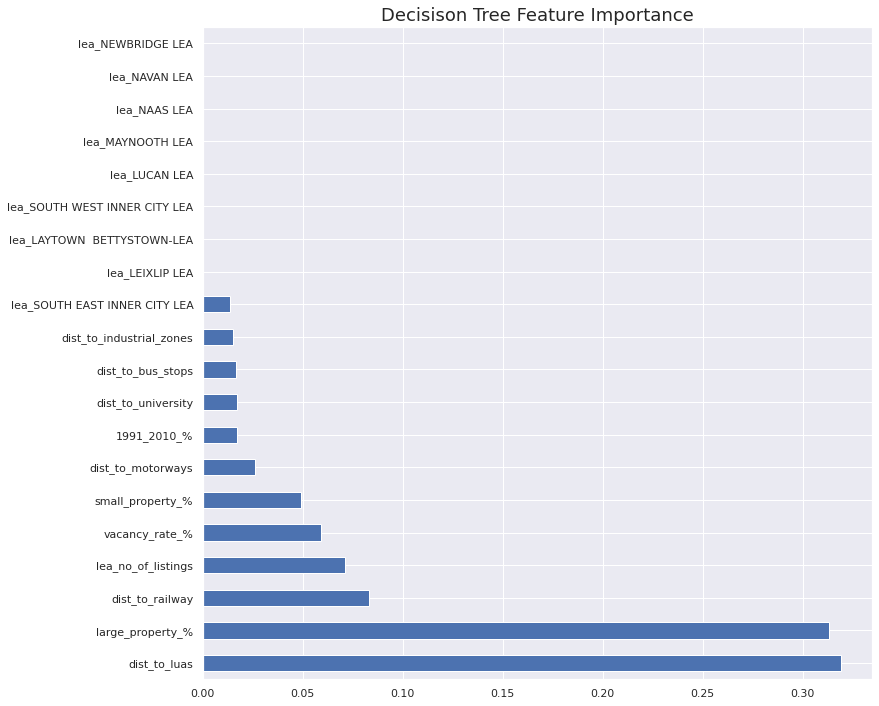

In [244]:
# Creating a plot to visualise the feature importance
sns.set()
fig, ax = plt.subplots(figsize=(12,12))
featimp[:20].plot(kind='barh')
plt.title("Decisison Tree Feature Importance", fontsize = 18)
plt.show()

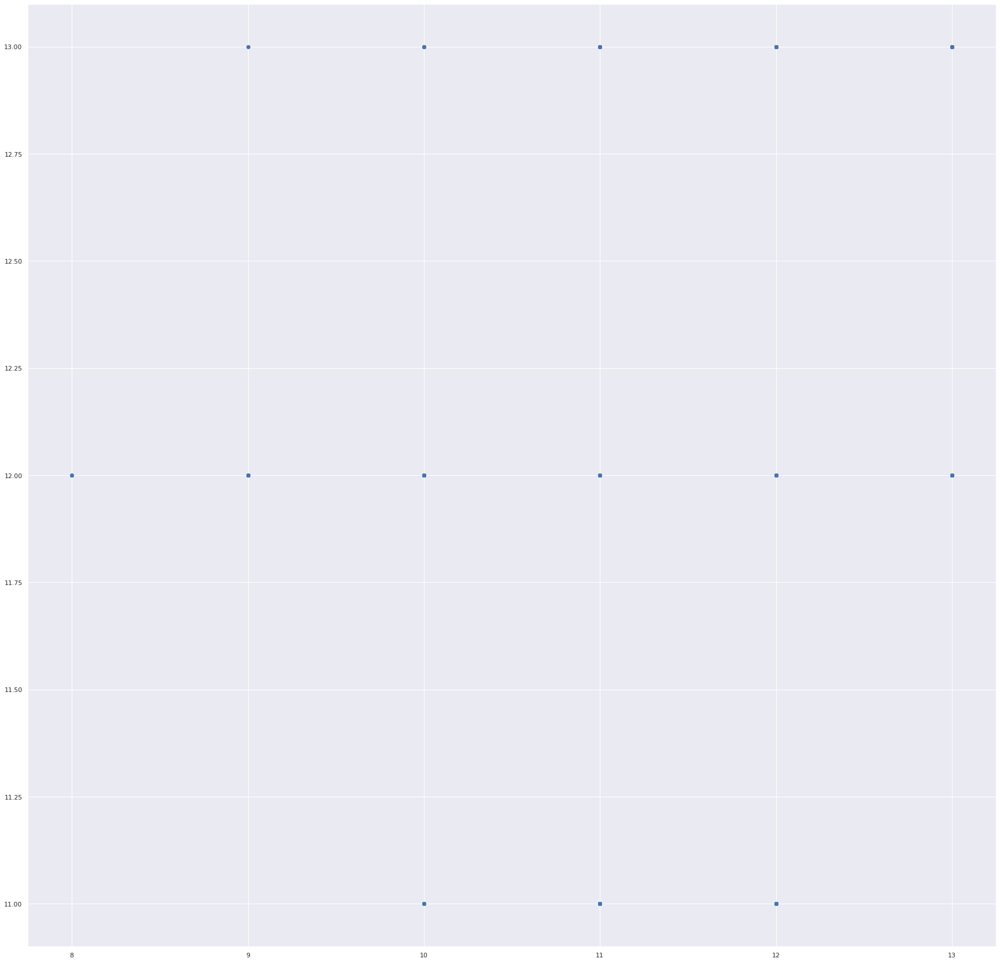

In [245]:
plt.scatter(log_LEA_ppr_percent_y_test, Y_pred)

(array([3.000e+00, 0.000e+00, 1.100e+01, 0.000e+00, 5.200e+01, 0.000e+00,
        7.630e+02, 0.000e+00, 4.684e+03, 7.950e+02]),
 array([-4. , -3.5, -3. , -2.5, -2. , -1.5, -1. , -0.5,  0. ,  0.5,  1. ]),
 <a list of 10 Patch objects>)

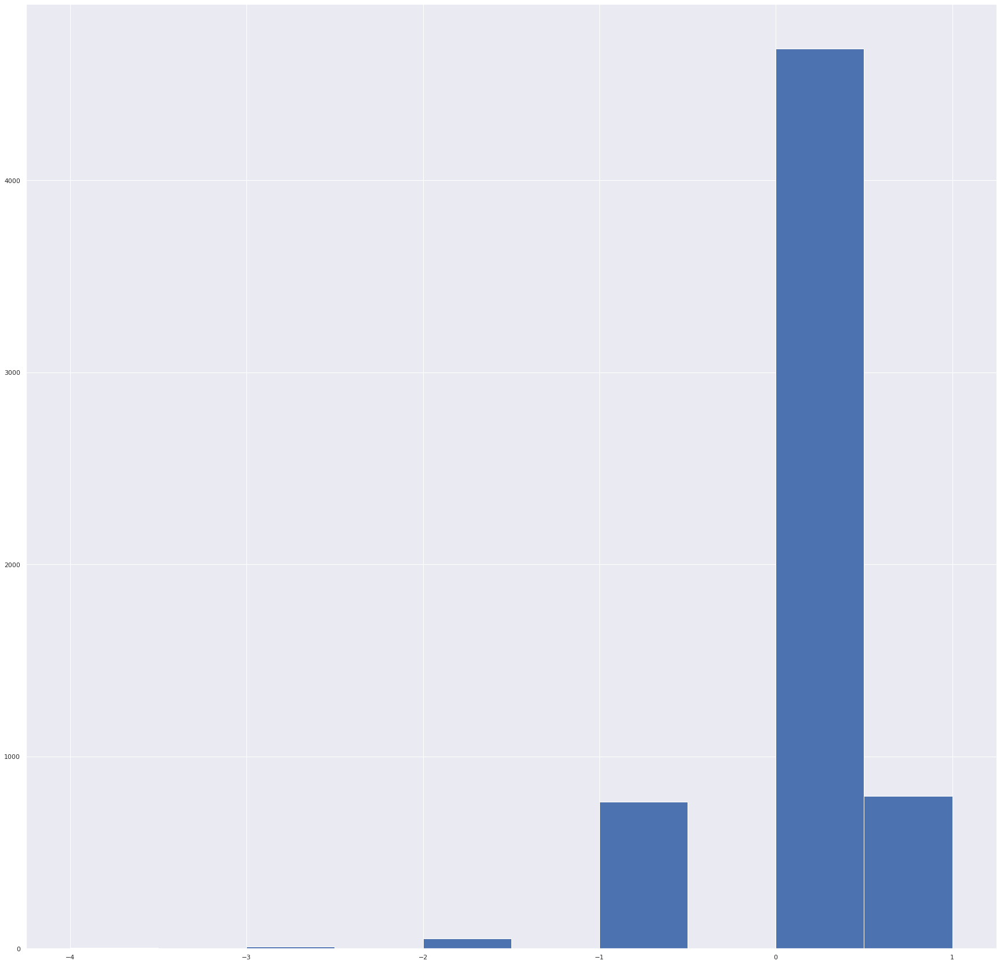

In [246]:
plt.hist(log_LEA_ppr_percent_y_test- Y_pred)

### *Random Forest*

In [247]:
rfc = RandomForestClassifier(n_estimators=300, criterion='entropy', max_features='auto')
rfc.fit(log_LEA_ppr_percent_X_train, log_LEA_ppr_percent_y_train)
Y_pred = rfc.predict(log_LEA_ppr_percent_X_test)
metrics.r2_score(log_LEA_ppr_percent_y_test, Y_pred)



0.1606871388857325

In [248]:
featimp = pd.Series(rfc.feature_importances_, index=list(log_LEA_ppr_percent_X_test)).sort_values(ascending=False)
print(featimp)

dist_to_luas                        0.09902
large_property_%                    0.07841
small_property_%                    0.06773
dist_to_railway                     0.06451
dist_to_university                  0.06392
dist_to_bus_stops                   0.06204
dist_to_commercial_zones            0.05938
dist_to_motorways                   0.05925
dist_to_industrial_zones            0.05835
lea_no_of_listings                  0.05643
pre_1991_%                          0.05151
1991_2010_%                         0.04823
vacancy_rate_%                      0.04012
crime_total                         0.03966
month_year_2021-08                  0.00875
month_year_2021-09                  0.00859
month_year_2021-10                  0.00773
month_year_2021-12                  0.00715
month_year_2021-11                  0.00692
month_year_2022-01                  0.00666
month_year_2022-03                  0.00609
month_year_2022-04                  0.00585
month_year_2022-02              

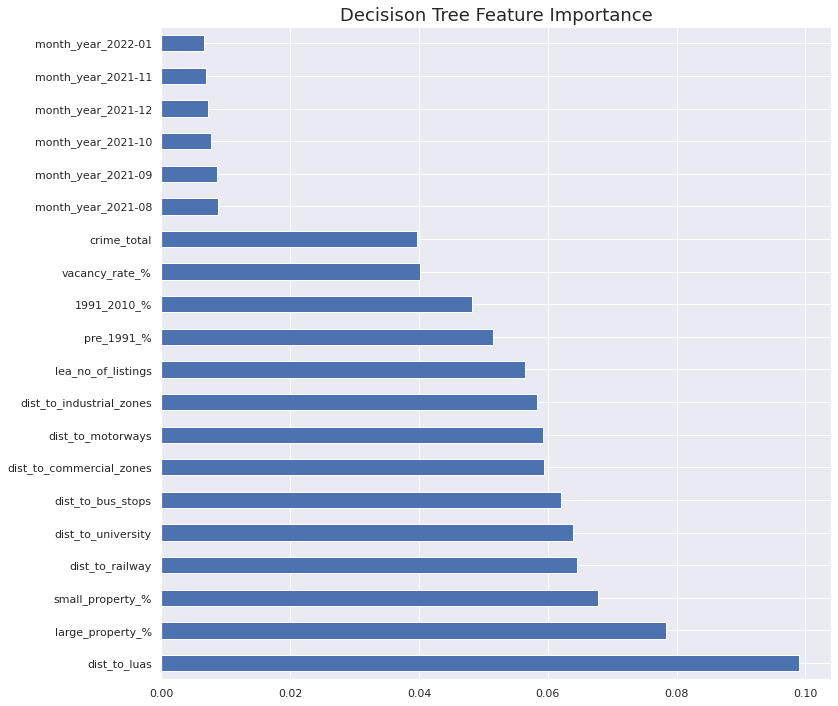

In [249]:
# Creating a plot to visualise the feature importance
sns.set()
fig, ax = plt.subplots(figsize=(12,12))
featimp[:20].plot(kind='barh')
plt.title("Decisison Tree Feature Importance", fontsize = 18)
plt.show()

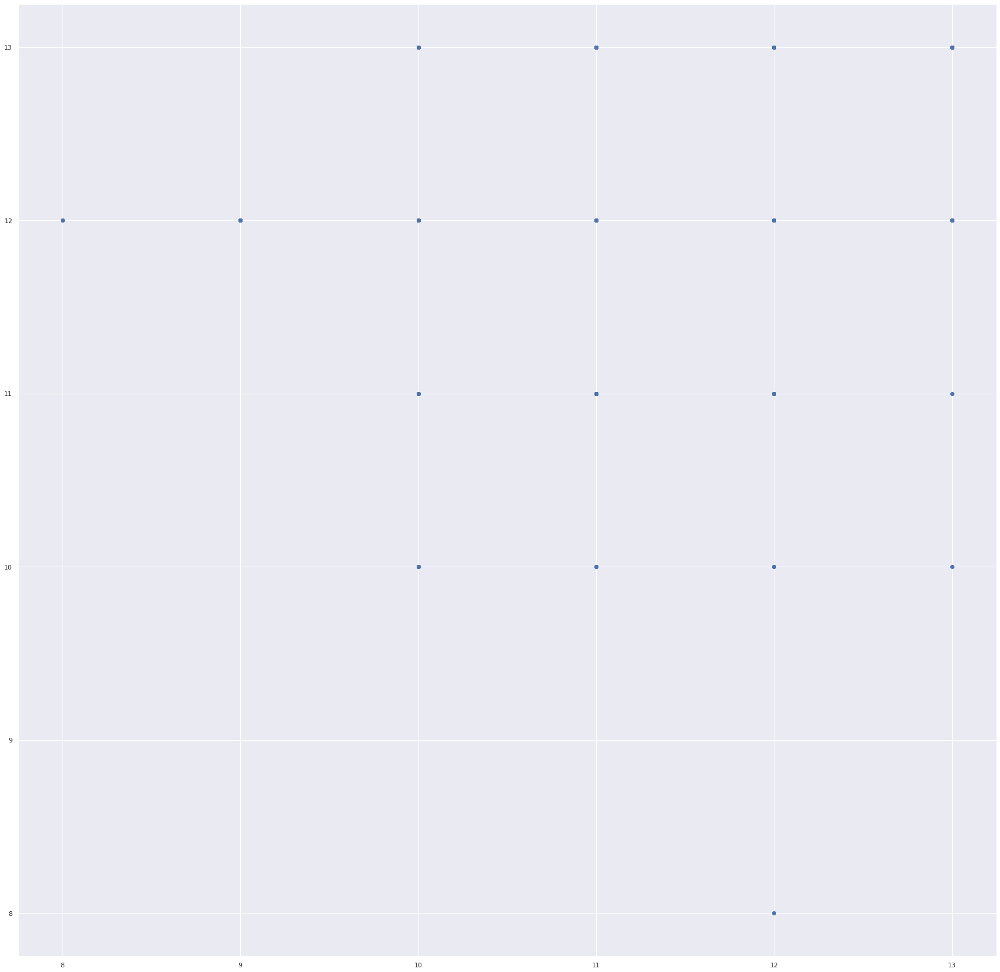

In [250]:
plt.scatter(log_LEA_ppr_percent_y_test, Y_pred)

## LEA Normal

### *Log Data*

In [277]:
DUBLIN_LEA_ppr_normal = LEA_ppr_normal[LEA_ppr_normal['county'].str.contains( 'DUBLIN')]
DUBLIN_LEA_ppr_normal.shape


(12932, 48)

In [278]:
# log_LEA_ppr_normal = LEA_ppr_normal.copy()

log_LEA_ppr_normal = LEA_ppr_normal.copy()

log_LEA_ppr_normal = log_LEA_ppr_normal[['price', 
                  # 'month_year',
                  # 'latitude', 'longitude', 
                  # 'geometry', 
                  # 'electoral_divisions',
                  # 'county',

#### Type of Accommodation
      #  'house_bungalow', 'flat_apartment',  'bed_sit','caravan_mobile_home', 'type_of_accommodation_not_statd',
#### Year BuilT
      #  'pre_1919', '1919_1945', '1946_1960', '1961_1970', '1971_1980', '1981_1990_%', '1991_2000', '2001_2010', '2011_or_later', 'year_built_not_stated',
#### Property Size       
      #  '1_room', '2_rooms','3_rooms', '4_rooms', '5_rooms', '6_rooms', '7_rooms','8_or_more_rooms', 'number_of_rooms_not_stated', 


#### Type of Accommodation REDUCED
      #  'house_bungalow', 'flat_apartment', 'other_accomodation', 
#### Year Built REDUCED
       'pre_1991', '1991_2010',
       
       #'2011_or_later', 
#### Property Size REDUCED
       'small_property', #'medium_property',
        'large_property',
 

       'vacant_dwellings',

       'crime_total', 
       
      #  'range_ed_no_of_listings', 
       'lea_no_of_listings',

       'dist_to_railway', 'dist_to_university', 'dist_to_luas',
       'dist_to_commercial_zones', 'dist_to_motorways', 'dist_to_bus_stops',
       'dist_to_industrial_zones']]

In [279]:
# print summary information to view data
log_LEA_ppr_normal.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21026 entries, 0 to 22167
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   price                     21026 non-null  float64
 1   pre_1991                  21026 non-null  float64
 2   1991_2010                 21026 non-null  float64
 3   small_property            21026 non-null  float64
 4   large_property            21026 non-null  float64
 5   vacant_dwellings          21026 non-null  float64
 6   crime_total               21026 non-null  float64
 7   lea_no_of_listings        21026 non-null  float64
 8   dist_to_railway           21026 non-null  float64
 9   dist_to_university        21026 non-null  float64
 10  dist_to_luas              21026 non-null  float64
 11  dist_to_commercial_zones  21026 non-null  float64
 12  dist_to_motorways         21026 non-null  float64
 13  dist_to_bus_stops         21026 non-null  float64
 14  dist_t

In [280]:

log_LEA_ppr_normal['price'] = np.log( log_LEA_ppr_normal['price'] + 0.0000000001 )

# log_LEA_ppr_normal['house_bungalow'] = np.log( log_LEA_ppr_normal['house_bungalow'] + 0.0000000001 )
# log_LEA_ppr_normal['flat_apartment'] = np.log( log_LEA_ppr_normal['flat_apartment'] + 0.0000000001 )
# log_LEA_ppr_normal['bed_sit'] = np.log( log_LEA_ppr_normal['bed_sit'] + 0.0000000001 )
# log_LEA_ppr_normal['caravan_mobile_home'] = np.log( log_LEA_ppr_normal['caravan_mobile_home'] + 0.0000000001 )
# log_LEA_ppr_normal['type_of_accommodation_not_statd'] = np.log( log_LEA_ppr_normal['type_of_accommodation_not_statd'] + 0.0000000001 )

log_LEA_ppr_normal['pre_1991'] = np.log( log_LEA_ppr_normal['pre_1991'] + 0.0000000001 )
log_LEA_ppr_normal['1991_2010'] = np.log( log_LEA_ppr_normal['1991_2010'] + 0.0000000001 )
# log_LEA_ppr_normal['2011_or_later'] = np.log( log_LEA_ppr_normal['2011_or_later'] + 0.0000000001 )

log_LEA_ppr_normal['small_property'] = np.log( log_LEA_ppr_normal['small_property'] + 0.0000000001 )
# log_LEA_ppr_normal['medium_property'] = np.log( log_LEA_ppr_normal['medium_property']+ 0.0000000001  )
log_LEA_ppr_normal['large_property'] = np.log( log_LEA_ppr_normal['large_property'] + 0.0000000001 )

log_LEA_ppr_normal['vacant_dwellings'] = np.log( log_LEA_ppr_normal['vacant_dwellings'] + 0.0000000001 )
log_LEA_ppr_normal['crime_total'] = np.log( log_LEA_ppr_normal['crime_total'] + 0.0000000001 )
log_LEA_ppr_normal['lea_no_of_listings'] = np.log( log_LEA_ppr_normal['lea_no_of_listings']+ 0.0000000001  )


log_LEA_ppr_normal['dist_to_railway'] = np.log( log_LEA_ppr_normal['dist_to_railway']+ 0.0000000001  )
log_LEA_ppr_normal['dist_to_luas'] = np.log( log_LEA_ppr_percent['dist_to_luas']+ 0.0000000001  )
log_LEA_ppr_normal['dist_to_commercial_zones'] = np.log( log_LEA_ppr_normal['dist_to_commercial_zones']+ 0.0000000001  )
log_LEA_ppr_normal['dist_to_motorways'] = np.log( log_LEA_ppr_normal['dist_to_motorways']+ 0.0000000001  )
log_LEA_ppr_normal['dist_to_bus_stops'] = np.log( log_LEA_ppr_normal['dist_to_bus_stops']+ 0.0000000001  )
log_LEA_ppr_normal['dist_to_industrial_zones'] = np.log( log_LEA_ppr_normal['dist_to_industrial_zones']+ 0.0000000001  )
log_LEA_ppr_normal['lea_no_of_listings'] = np.log( log_LEA_ppr_normal['lea_no_of_listings']+ 0.0000000001  )



/usr/local/lib/python3.7/dist-packages/pandas/core/arraylike.py:364: RuntimeWarning:

invalid value encountered in log



In [281]:
log_LEA_ppr_normal.shape

(21026, 15)

In [282]:
# checking for missing data
print('Nan in each columns' , log_LEA_ppr_normal.isna().sum(), sep='\n')


Nan in each columns
price                          0
pre_1991                       0
1991_2010                      0
small_property                 0
large_property                 0
vacant_dwellings               0
crime_total                    0
lea_no_of_listings             0
dist_to_railway                0
dist_to_university             0
dist_to_luas                3190
dist_to_commercial_zones       0
dist_to_motorways              0
dist_to_bus_stops              0
dist_to_industrial_zones       0
dtype: int64


In [283]:
# checking for missing data
print('Nan in each columns' , log_LEA_ppr_normal.isna().sum(), sep='\n')

# CATEGORICAL VARIABLES
# creating dummies for the dataset
log_LEA_ppr_normal = log_LEA_ppr_normal.reset_index()


# CAT_log_LEA_ppr_normal = pd.get_dummies(DUBLIN_LEA_ppr_normal[['lea',
#                                                         'month_year']], drop_first=True)

CAT_log_LEA_ppr_normal = pd.get_dummies(LEA_ppr_normal[['lea',
                                                        'month_year']], drop_first=True)

CAT_log_LEA_ppr_normal = CAT_log_LEA_ppr_normal.reset_index()


log_LEA_ppr_normal  = pd.merge(log_LEA_ppr_normal , CAT_log_LEA_ppr_normal, on = 'index', how = 'outer')

# dropping log_LEA_ppr_percent colunns
log_LEA_ppr_normal  = log_LEA_ppr_normal .drop(['index'], axis=1)


log_LEA_ppr_normal .head(1).transpose()

Nan in each columns
price                          0
pre_1991                       0
1991_2010                      0
small_property                 0
large_property                 0
vacant_dwellings               0
crime_total                    0
lea_no_of_listings             0
dist_to_railway                0
dist_to_university             0
dist_to_luas                3190
dist_to_commercial_zones       0
dist_to_motorways              0
dist_to_bus_stops              0
dist_to_industrial_zones       0
dtype: int64


,0
price,10.59663
pre_1991,4.71850
1991_2010,1.94591
small_property,4.41884
large_property,1.09861
vacant_dwellings,4.49981
crime_total,7.83795
lea_no_of_listings,1.64623
dist_to_railway,0.24285
dist_to_university,1.02592


### *Linear Regression*

In [284]:
# checking for missing data
print('Nan in each columns' , log_LEA_ppr_normal.isna().sum(), sep='\n')

Nan in each columns
price                                   0
pre_1991                                0
1991_2010                               0
small_property                          0
large_property                          0
vacant_dwellings                        0
crime_total                             0
lea_no_of_listings                      0
dist_to_railway                         0
dist_to_university                      0
dist_to_luas                         3190
dist_to_commercial_zones                0
dist_to_motorways                       0
dist_to_bus_stops                       0
dist_to_industrial_zones                0
lea_ARKLOW LEA                          0
lea_ARTANE-WHITEHALL LEA                0
lea_ASHBOURNE LEA                       0
lea_ATHY LEA                            0
lea_BALBRIGGAN LEA                      0
lea_BALLYFERMOT-DRIMNAGH LEA            0
lea_BALLYMUN-FINGLAS LEA                0
lea_BALTINGLASS LEA                     0
lea_BLACKROCK 

In [285]:

log_LEA_ppr_normal_X = log_LEA_ppr_normal.drop(['price'], axis =1)
log_LEA_ppr_normal_X = sm.add_constant(log_LEA_ppr_normal_X)

log_LEA_ppr_normal_y = log_LEA_ppr_normal["price"].astype(int)

print(log_LEA_ppr_normal_X.shape)
print(log_LEA_ppr_normal_y.shape)

(21026, 81)
(21026,)


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



In [287]:
log_LEA_ppr_normal_X = log_LEA_ppr_normal_X.fillna(0)

In [288]:
# =============================================================================
# LOG LINEAR REGRESSION
# =============================================================================
# adding the constant term
log_LEA_ppr_normal_X = sm.add_constant(log_LEA_ppr_normal_X)
 
# running OLS
log_model = sm.OLS(log_LEA_ppr_normal_y, log_LEA_ppr_normal_X)
log_results = log_model.fit()
log_results.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.246
Model:                            OLS   Adj. R-squared:                  0.243
Method:                 Least Squares   F-statistic:                     85.52
Date:                Wed, 10 Aug 2022   Prob (F-statistic):               0.00
Time:                        12:16:50   Log-Likelihood:                -14249.
No. Observations:               21026   AIC:                         2.866e+04
Df Residuals:                   20945   BIC:                         2.930e+04
Df Model:                          80                                         
Covariance Type:            nonrobust                                         
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const                                12.4106      0.093    134.070      0.000      12.229      12.592
pre_1991                              0.0049      0.002      2.992      0.003       0.002       0.008
1991_2010                             0.0010      0.001      1.612      0.107      -0.000       0.002
small_property                       -0.0773      0.003    -23.945      0.000      -0.084      -0.071
large_property                        0.0076      0.001     11.951      0.000       0.006       0.009
vacant_dwellings                     -0.0037      0.006     -0.624      0.532      -0.016       0.008
crime_total                          -0.0378      0.007     -5.481      0.000      -0.051      -0.024
lea_no_of_listings                   -0.1220      0.060     -2.038      0.042      -0.239      -0.005
dist_to_railway                       0.0170      0.005      3.202      0.001       0.007       0.027
dist_to_university                   -0.0087      0.001     -7.275      0.000      -0.011      -0.006
dist_to_luas                          0.0039      0.005      0.757      0.449      -0.006       0.014
dist_to_commercial_zones              0.0109      0.004      2.694      0.007       0.003       0.019
dist_to_motorways                     0.0014      0.006      0.248      0.804      -0.010       0.012
dist_to_bus_stops                     0.0182      0.004      4.483      0.000       0.010       0.026
dist_to_industrial_zones              0.0173      0.005      3.765      0.000       0.008       0.026
lea_ARKLOW LEA                        0.3777      0.059      6.389      0.000       0.262       0.494
lea_ARTANE-WHITEHALL LEA              0.4601      0.048      9.530      0.000       0.365       0.555
lea_ASHBOURNE LEA                     0.3965      0.049      8.169      0.000       0.301       0.492
lea_ATHY LEA                         -0.0627      0.049     -1.273      0.203      -0.159       0.034
lea_BALBRIGGAN LEA                    0.4754      0.046     10.251      0.000       0.385       0.566
lea_BALLYFERMOT-DRIMNAGH LEA          0.3339      0.048      6.977      0.000       0.240       0.428
lea_BALLYMUN-FINGLAS LEA              0.4067      0.048      8.403      0.000       0.312       0.502
lea_BALTINGLASS LEA                   0.1388      0.054      2.550      0.011       0.032       0.245
lea_BLACKROCK LEA                     0.8912      0.048     18.545      0.000       0.797       0.985
lea_BLANCHARDSTOWN-MULHUDDART LEA     0.3698      0.047      7.845      0.000       0.277       0.462
lea_BRAY EAST LEA                     0.5937      0.056     10.645      0.000       0.484       0.703
lea_BRAY WEST LEA                     0.5701      0.055     10.292      0.000       0.462       0.679
lea_CABRA-GLASNEVIN LEA

### *Training and Test Set*

In [289]:
# TRAINING AND TEST SET
# Dividing dataset into training and test sets
log_LEA_ppr_normal_X_train, log_LEA_ppr_normal_X_test, log_LEA_ppr_normal_y_train, log_LEA_ppr_normal_y_test = train_test_split( log_LEA_ppr_normal_X, log_LEA_ppr_normal_y, test_size = 0.3, random_state = 100)

print(log_LEA_ppr_normal_X_train.shape)
print(log_LEA_ppr_normal_y_test.shape)

(14718, 81)
(6308,)


### *Decision Tree*

In [291]:
# Building Classification Decision Tree Model
dtree = tree.DecisionTreeClassifier(criterion = 'entropy', max_depth = 5)
dtree.fit(log_LEA_ppr_normal_X_train, log_LEA_ppr_normal_y_train)
Y_pred = dtree.predict(log_LEA_ppr_normal_X_test)
metrics.r2_score(log_LEA_ppr_normal_y_test, Y_pred)



-0.023300163181188216

In [292]:

featimp = pd.Series(dtree.feature_importances_, index=list(log_LEA_ppr_percent_X_test)).sort_values(ascending=False)
print(featimp)

large_property_%                    0.28800
1991_2010_%                         0.15985
crime_total                         0.13582
lea_no_of_listings                  0.09070
dist_to_bus_stops                   0.06199
small_property_%                    0.05330
lea_DUNDALK-CARLINGFORD LEA         0.04610
vacancy_rate_%                      0.03218
dist_to_motorways                   0.03161
dist_to_university                  0.03112
lea_GLENCULLEN-SANDYFORD LEA        0.01757
pre_1991_%                          0.01317
lea_FIRHOUSE-BOHERNABREENA LEA      0.01279
lea_HOWTH-MALAHIDE LEA              0.00955
lea_KELLS LEA                       0.00929
month_year_2021-09                  0.00696
lea_PEMBROKE LEA                    0.00000
lea_NORTH INNER CITY LEA            0.00000
lea_PALMERSTOWN-FONTHILL LEA        0.00000
lea_RATHFARNHAM-TEMPLEOGUE LEA      0.00000
lea_ONGAR LEA                       0.00000
lea_MAYNOOTH LEA                    0.00000
lea_NEWBRIDGE LEA               

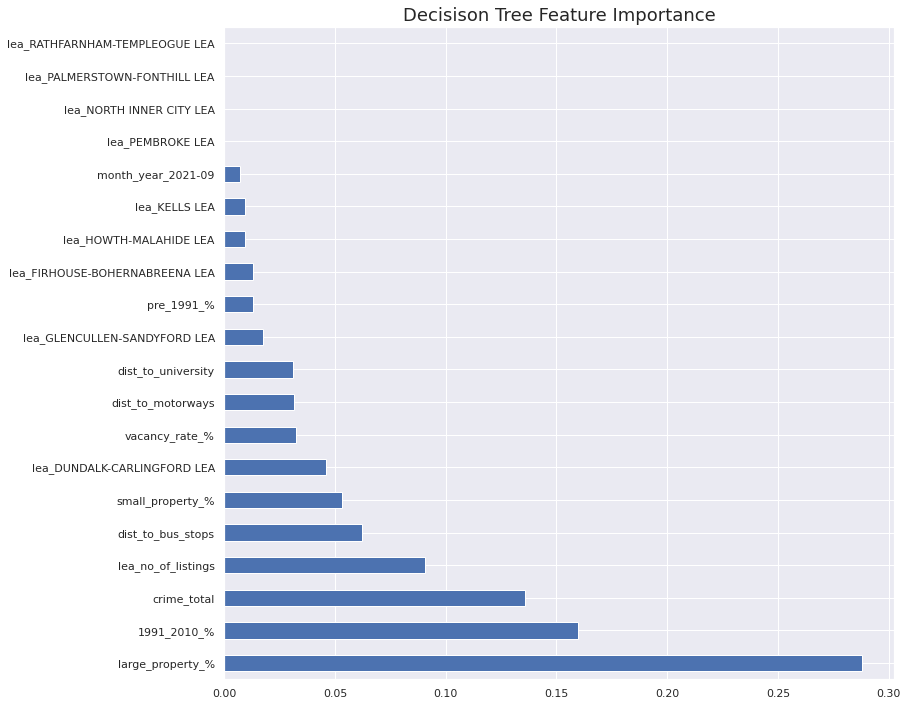

In [293]:
# Creating a plot to visualise the feature importance
sns.set()
fig, ax = plt.subplots(figsize=(12,12))
featimp[:20].plot(kind='barh')
plt.title("Decisison Tree Feature Importance", fontsize = 18)
plt.show()


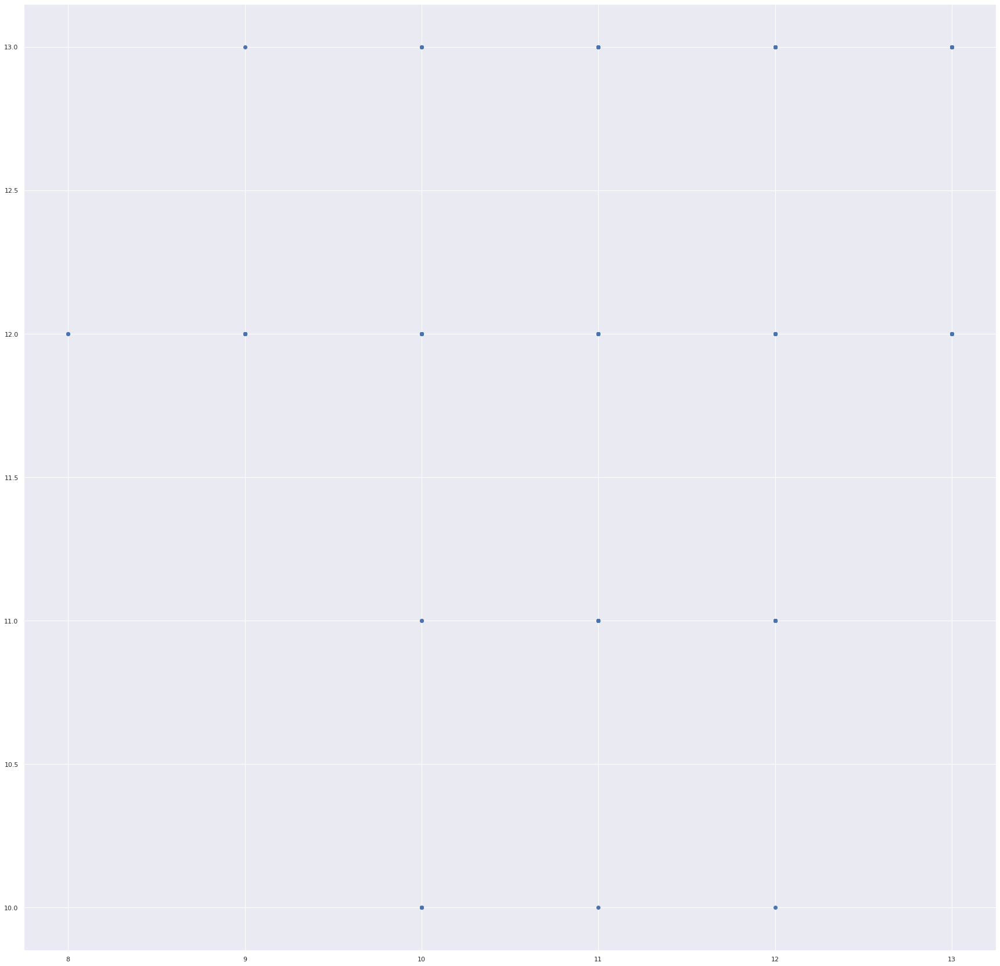

In [294]:
plt.scatter(log_LEA_ppr_normal_y_test, Y_pred)

(array([3.000e+00, 1.100e+01, 0.000e+00, 5.700e+01, 0.000e+00, 7.110e+02,
        4.635e+03, 0.000e+00, 8.900e+02, 1.000e+00]),
 array([-4. , -3.4, -2.8, -2.2, -1.6, -1. , -0.4,  0.2,  0.8,  1.4,  2. ]),
 <a list of 10 Patch objects>)

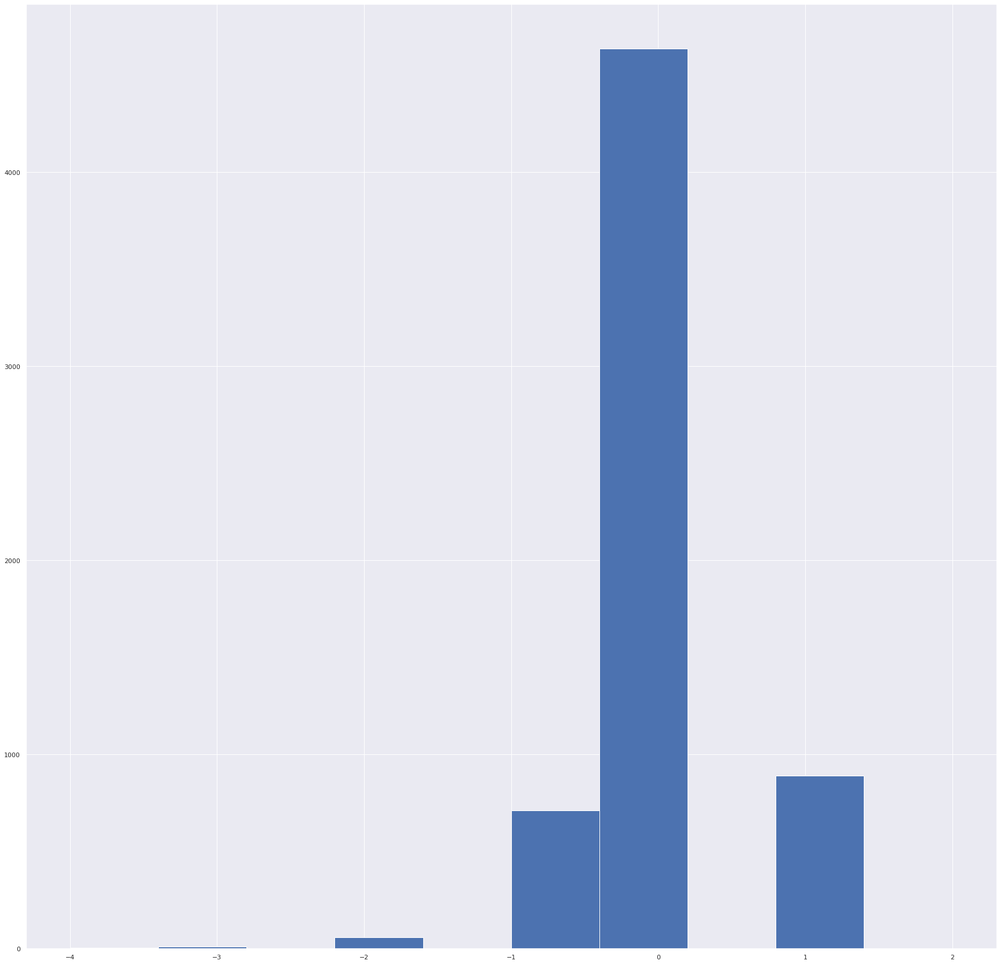

In [295]:
plt.hist(log_LEA_ppr_normal_y_test- Y_pred)

### *Random Forest*

In [296]:
rfc = RandomForestClassifier(n_estimators=300, criterion='entropy', max_features='auto')
rfc.fit(log_LEA_ppr_normal_X_train, log_LEA_ppr_normal_y_train)
Y_pred = rfc.predict(log_LEA_ppr_normal_X_test)
metrics.r2_score(log_LEA_ppr_normal_y_test, Y_pred)


0.1725739589630897

In [297]:
featimp = pd.Series(rfc.feature_importances_, index=list(log_LEA_ppr_percent_X_test)).sort_values(ascending=False)
print(featimp)

large_property_%                    0.07666
dist_to_university                  0.06768
dist_to_railway                     0.06681
dist_to_luas                        0.06621
dist_to_bus_stops                   0.06429
small_property_%                    0.06393
dist_to_motorways                   0.06247
dist_to_commercial_zones            0.06061
dist_to_industrial_zones            0.05827
lea_no_of_listings                  0.05728
pre_1991_%                          0.05358
1991_2010_%                         0.05255
vacancy_rate_%                      0.04593
crime_total                         0.04529
month_year_2021-09                  0.00809
month_year_2021-08                  0.00799
month_year_2021-10                  0.00702
month_year_2021-12                  0.00676
month_year_2021-11                  0.00647
month_year_2022-01                  0.00612
month_year_2022-03                  0.00568
month_year_2022-04                  0.00548
month_year_2022-02              

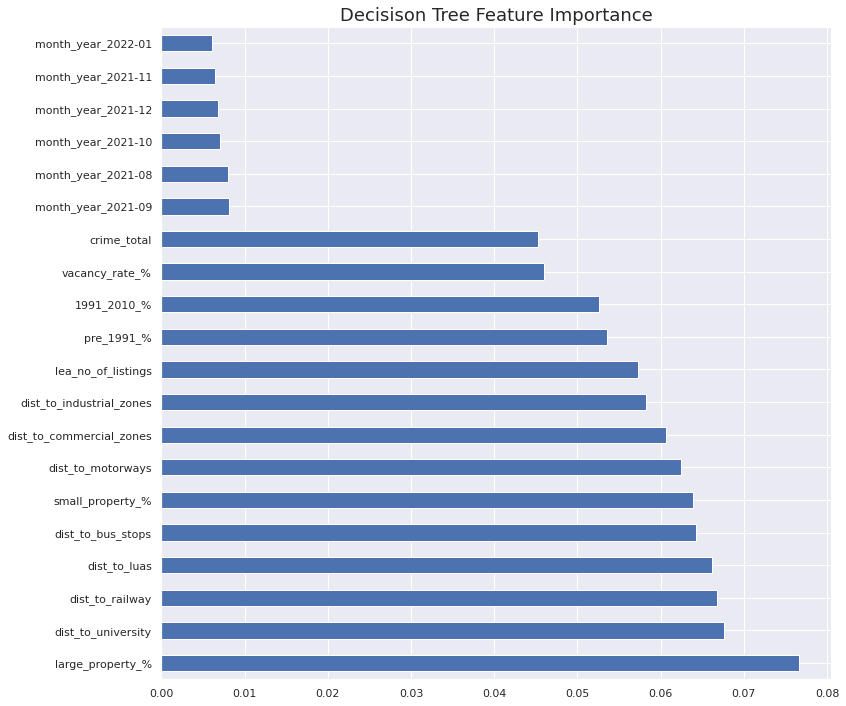

In [298]:
# Creating a plot to visualise the feature importance
sns.set()
fig, ax = plt.subplots(figsize=(12,12))
featimp[:20].plot(kind='barh')
plt.title("Decisison Tree Feature Importance", fontsize = 18)
plt.show()


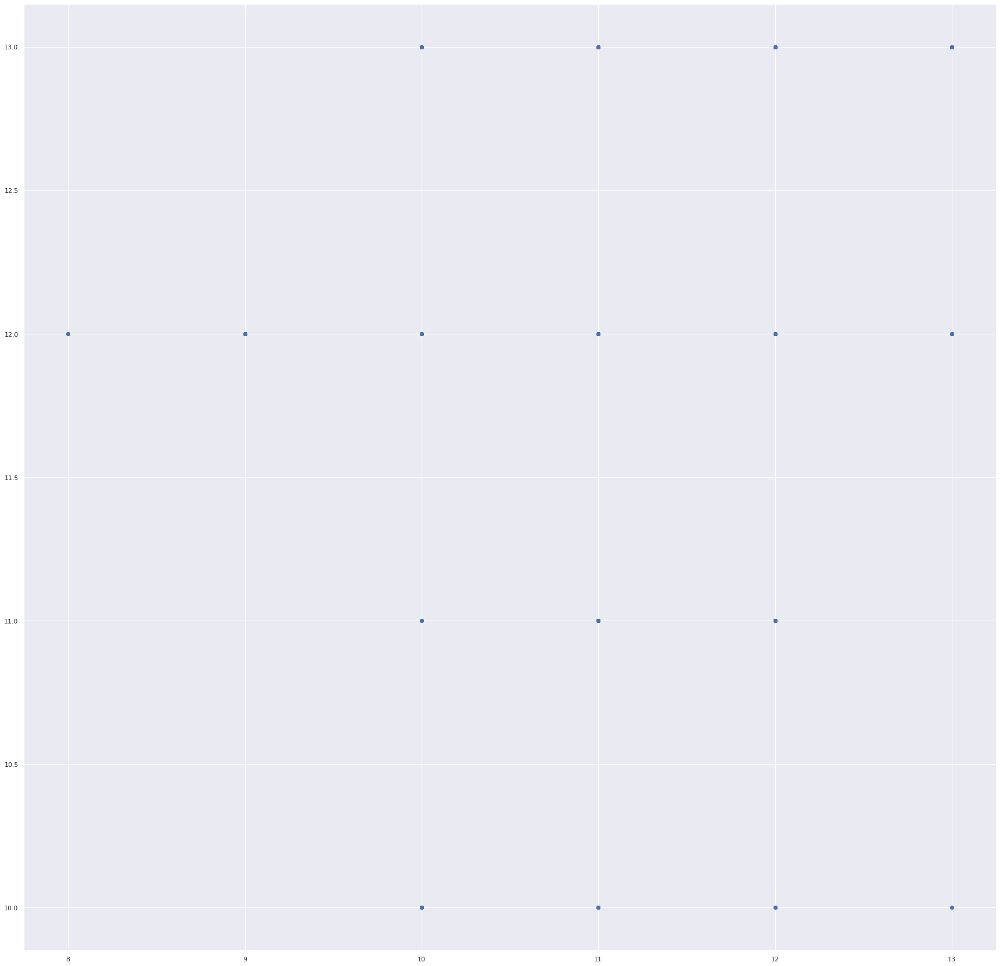

In [299]:
plt.scatter(log_LEA_ppr_normal_y_test, Y_pred)